In [1]:
!pip install biopython

In [17]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2"


import os


os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"

import numpy as np

# Загрузка датасета в формате FASTA

In [18]:
from Bio import SeqIO

# Зададим путь к данным
file_path = "ictv_reference_no_inserted.fa"

# Распарсим файл в формате FASTA
records = {}

for record in SeqIO.parse(file_path, "fasta"):
    record_id = record.id.split('.')[0]

    if record_id not in records:
        records[record_id] = str(record.seq)
    else:
        print("MISTAKE")

In [19]:
# Проанализируем минимальную и максимальную длины
max_lengths = []

for record in records.values():
    max_lengths.append(len(record))

min(max_lengths), max(max_lengths)

(166, 1991922)

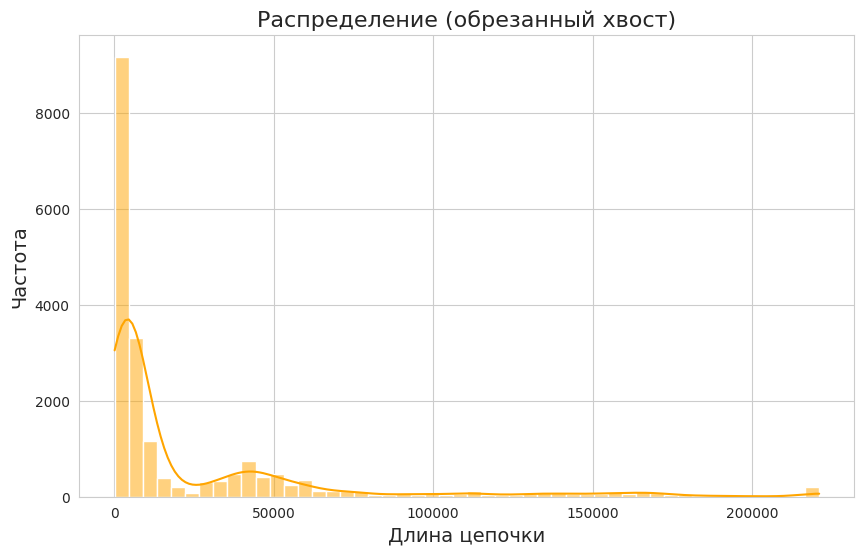

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Находим 99-й перцентиль
threshold = np.percentile(max_lengths, 99)

# Усечение данных по трешхолду, вычисленному на основе перцентиля
trimmed_lengths = [x if x <= threshold else threshold for x in max_lengths]

# Построим график
sns.set_style('whitegrid')
plt.figure(figsize = (10, 6))
sns.histplot(trimmed_lengths, bins = 50, kde = True, color = 'orange')
plt.title('Распределение (обрезанный хвост)', fontsize = 16)
plt.xlabel('Длина цепочки', fontsize=14)
plt.ylabel('Частота', fontsize=14)
plt.show()


In [21]:
record_items = records.items()
record_ids = list(map(lambda x: x[0], record_items))
record_values = list(map(lambda x: x[1], record_items))

# Загрузка датасета-таблицы с характеристиками вирусов

In [40]:
import pandas as pd

# Укажем путь к файлу
file_path = "VMR_MSL39_v2.xlsx"

# Читаем второй лист (индексация листов начинается с 0)
second_sheet = pd.read_excel(file_path, sheet_name = 1)

# Покажем первые несколько строк
print(second_sheet.head())

   Isolate ID  Species Sort  Isolate Sort      Realm  Subrealm      Kingdom  \
0     1000002             1             1  Adnaviria       NaN  Zilligvirae   
1     1000001             2             1  Adnaviria       NaN  Zilligvirae   
2     1000003             3             1  Adnaviria       NaN  Zilligvirae   
3     1000008             4             1  Adnaviria       NaN  Zilligvirae   
4     1000005             5             1  Adnaviria       NaN  Zilligvirae   

   Subkingdom         Phylum Subphylum          Class  ...  \
0         NaN  Taleaviricota       NaN  Tokiviricetes  ...   
1         NaN  Taleaviricota       NaN  Tokiviricetes  ...   
2         NaN  Taleaviricota       NaN  Tokiviricetes  ...   
3         NaN  Taleaviricota       NaN  Tokiviricetes  ...   
4         NaN  Taleaviricota       NaN  Tokiviricetes  ...   

                             Virus name(s) Virus name abbreviation(s)  \
0           Sulfolobus filamentous virus 1                       SFV1   
1   Su

In [41]:
# Посмотрим на имеющиеся колонки
second_sheet.columns

Index(['Isolate ID', 'Species Sort', 'Isolate Sort', 'Realm', 'Subrealm',
       'Kingdom', 'Subkingdom', 'Phylum', 'Subphylum', 'Class', 'Subclass',
       'Order', 'Suborder', 'Family', 'Subfamily', 'Genus', 'Subgenus',
       'Species', 'Exemplar or additional isolate', 'Virus name(s)',
       'Virus name abbreviation(s)', 'Virus isolate designation',
       'Virus GENBANK accession', 'Virus REFSEQ accession',
       'Virus REFSEQ NCBI taxid', 'Genome coverage', 'Genome composition',
       'Host source', 'Accessions Link'],
      dtype='object')

In [42]:
# Оставим только самые нужные колонки
virus_data = second_sheet[[
    "Isolate ID", "Family", "Genus", "Species", "Host source", "Virus GENBANK accession", "Kingdom"
]].dropna(
    subset = ["Virus GENBANK accession", "Family"]
)

In [43]:
len(virus_data)

13590

In [44]:
len(virus_data.drop_duplicates())

13590

In [45]:
len(virus_data[["Isolate ID"]].drop_duplicates())

13590

In [46]:
# У части вирусов несколько айдишников, указывающих на цепочки, развернем их в разные строки
virus_data['Virus GENBANK accession'] = virus_data['Virus GENBANK accession'].str.split('; ')
virus_data = virus_data.explode('Virus GENBANK accession', ignore_index = True)

In [47]:
# В некоторых строчках есть лишняя информация, удалим ее
virus_data['Virus GENBANK accession'] = virus_data['Virus GENBANK accession'].apply(
    lambda x: x.split(': ', 1)[1] if ': ' in x else x
)
virus_data['Virus GENBANK accession'] = virus_data['Virus GENBANK accession'].apply(
    lambda x: x.split(' ', 1)[0] if ' ' in x else x
)

In [48]:
virus_data

,Isolate ID,Family,Genus,Species,Host source,Virus GENBANK accession,Kingdom
0,1000002,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus beppuense,archaea,MH447526,Zilligvirae
1,1000001,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus umijigokuense,archaea,MK064563,Zilligvirae
2,1000003,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus acidiani,archaea,AM087120,Zilligvirae
3,1000008,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus hveragerdiense,archaea,AF440571,Zilligvirae
4,1000005,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus pezzuloense,archaea,AM087122,Zilligvirae
...,...,...,...,...,...,...,...
17117,1006173,Tolecusatellitidae,Deltasatellite,Deltasatellite sidaflavussecundi,plants,JN819490,NaN
17118,1006174,Tolecusatellitidae,Deltasatellite,Deltasatellite sidaflavustertii,plants,JN819498,NaN
17119,1006178,Tolecusatellitidae,Deltasatellite,Deltasatellite solani,plants,U74627,NaN
17120,1006179,Tolecusatellitidae,Deltasatellite,Deltasatellite solaniflavusprimi,plants,JN819495,NaN


# Функция для вычисления метрик

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd

import numpy as np

def draw_kmeans_plot(virus_data_with_embs, feature, k_min = 2, k_max = 40, step = 2):
    """
    Выполняет кластеризацию K-Means с разным количеством кластеров и вычисляет метрики качества.

    Параметры:
    - virus_data_with_embs (pd.DataFrame): DataFrame, содержащий эмбеддинги и истинные метки.
    - feature (str): Название колонки с истинными метками классов.
    - k_min (int): Минимальное количество кластеров для K-Means.
    - k_max (int): Максимальное количество кластеров для K-Means.

    Возвращает:
    - optimal_k (int): Оптимальное количество кластеров на основе Silhouette Score.
    """
    # Проверка наличия необходимых колонок
    if 'embeds' not in virus_data_with_embs.columns:
        raise ValueError("DataFrame должен содержать колонку 'embeds' с эмбеддингами.")
    if feature not in virus_data_with_embs.columns:
        raise ValueError(f"DataFrame должен содержать колонку '{feature}' с истинными метками.")

    # Извлечение эмбеддингов и истинных меток
    X = np.stack(virus_data_with_embs['embeds'].values)
    true_labels = virus_data_with_embs[feature].values

    print("Число уникальных меток", len(set(true_labels)))

    # Масштабирование данных
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Применение PCA для 2D-визуализации
    pca = PCA(n_components=2, random_state=42)
    reduced_embeddings = pca.fit_transform(X_scaled)
    virus_data_with_embs['x'] = reduced_embeddings[:, 0]
    virus_data_with_embs['y'] = reduced_embeddings[:, 1]

    # Подготовка списков для хранения метрик
    ari_scores = []
    nmi_scores = []
    silhouette_scores = []

    # Диапазон значений k
    k_values = range(k_min, k_max + 1, step)

    print("Выполнение кластеризации K-Means и вычисление метрик:")
    for k in k_values:
        # Кластеризация K-Means
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(X_scaled)

        # Вычисление метрик
        ari = adjusted_rand_score(true_labels, cluster_labels)
        nmi = normalized_mutual_info_score(true_labels, cluster_labels)
        silhouette_avg = silhouette_score(X_scaled, cluster_labels)

        # Сохранение метрик
        ari_scores.append(ari)
        nmi_scores.append(nmi)
        silhouette_scores.append(silhouette_avg)

        print(f"K={k}: ARI={ari:.4f}, NMI={nmi:.4f}, Silhouette Score={silhouette_avg:.4f}")

    # Визуализация метрик
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.plot(k_values, ari_scores, marker='o')
    plt.title('Adjusted Rand Index (ARI) vs K')
    plt.xlabel('Количество кластеров K')
    plt.ylabel('ARI')
    plt.xticks(k_values)
    plt.grid(True)

    plt.subplot(1, 3, 2)
    plt.plot(k_values, nmi_scores, marker='o', color='orange')
    plt.title('Normalized Mutual Information (NMI) vs K')
    plt.xlabel('Количество кластеров K')
    plt.ylabel('NMI')
    plt.xticks(k_values)
    plt.grid(True)

    plt.subplot(1, 3, 3)
    plt.plot(k_values, silhouette_scores, marker='o', color='green')
    plt.title('Silhouette Score vs K')
    plt.xlabel('Количество кластеров K')
    plt.ylabel('Silhouette Score')
    plt.xticks(k_values)
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    # # Определение оптимального k по максимальному Silhouette Score
    # optimal_k = k_values[np.argmax(silhouette_scores)]
    # print(f"Оптимальное количество кластеров по Silhouette Score: K={optimal_k}")

    # # Кластеризация с оптимальным k
    # kmeans_opt = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    # cluster_labels_opt = kmeans_opt.fit_predict(X_scaled)

    # # Добавление меток кластеров в DataFrame
    # virus_data_with_embs['cluster'] = cluster_labels_opt

    # # Визуализация кластеров
    # plt.figure(figsize=(8, 6))
    # unique_clusters = np.unique(cluster_labels_opt)
    # colors = plt.cm.get_cmap('tab10', len(unique_clusters))

    # for cluster in unique_clusters:
    #     subset = virus_data_with_embs[virus_data_with_embs['cluster'] == cluster]
    #     plt.scatter(subset['x'], subset['y'], label=f'Кластер {cluster}', alpha=0.6, s=50)

    # plt.title(f'K-Means Clustering with K={optimal_k}')
    # plt.xlabel('PCA Dimension 1')
    # plt.ylabel('PCA Dimension 2')
    # plt.legend()
    # plt.grid(True)
    # plt.show()

    # return optimal_k

In [71]:
import torch
from tqdm import tqdm
from torch.cuda.amp import autocast
from torch.utils.data import DataLoader, Dataset
import random
import numpy as np

class SequenceDataset(Dataset):
    def __init__(self, sequences, tokenizer, max_length):
        """
        Инициализация датасета.

        :param sequences: Список последовательностей.
        :param tokenizer: Токенизатор (например, из Hugging Face Transformers).
        :param max_length: Максимальная длина последовательности после токенизации.
        """
        self.sequences = sequences
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        """
        Получение одного элемента датасета.

        :param idx: Индекс последовательности.
        :return: Словарь с `input_ids` и `attention_mask`.
        """
        sequence = self.sequences[idx]
        
        # Токенизация без усечения
        encoding = self.tokenizer.encode_plus(
            sequence,
            add_special_tokens=True,
            return_attention_mask=True,
            return_tensors='pt',
            padding='max_length',  # Паддинг до max_length
            max_length=self.max_length,
            truncation=False  # Отключаем автоматическое усечение
        )
        input_ids = encoding['input_ids'].squeeze(0)  # Удаляем лишнее измерение
        attention_mask = encoding['attention_mask'].squeeze(0)

        # Если длина последовательности превышает max_length, выбираем случайный кусочек
        if input_ids.size(0) > self.max_length:
            # Вычисляем допустимый диапазон начала окна
            max_start = input_ids.size(0) - self.max_length
            start_idx = random.randint(0, max_start)
            input_ids = input_ids[start_idx:start_idx + self.max_length]
            attention_mask = attention_mask[start_idx:start_idx + self.max_length]
        # Если длина меньше max_length, паддинг уже применен

        return {
            'input_ids': input_ids,
            'attention_mask': attention_mask
        }

# InstaDeepAI/nucleotide-transformer-v2-50m-multi-species

In [37]:
from transformers import AutoTokenizer, AutoModelForMaskedLM
import torch

tokenizer = AutoTokenizer.from_pretrained("InstaDeepAI/nucleotide-transformer-v2-50m-multi-species", trust_remote_code=True)
model = AutoModelForMaskedLM.from_pretrained("InstaDeepAI/nucleotide-transformer-v2-50m-multi-species", trust_remote_code=True).half().to("cuda")

max_length = tokenizer.model_max_length

In [38]:
max_length

2048

In [39]:
# Параметры
batch_size = 4  # Настройте в соответствии с памятью GPU
max_length = 2048  # Максимальная длина последовательности

# Настройка устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Создание датасета и загрузчика данных
dataset = SequenceDataset(record_values, tokenizer, max_length)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

In [19]:
# Перенос модели на устройство и установка режима оценки
model.to(device)
model.eval()

embeds = []

# Отключение вычисления градиентов
with torch.no_grad():
    for batch in tqdm(dataloader, desc="Processing Batches"):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)

        # Использование смешанной точности (опционально)
        with autocast():
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask,
                encoder_attention_mask=attention_mask,
                output_hidden_states=True
            )

        # Получение последнего скрытого слоя
        embeddings = outputs.hidden_states[-1]  # Форма: (batch_size, seq_length, hidden_size)

        # Среднее пуллирование с учетом маски внимания
        attention_mask_expanded = attention_mask.unsqueeze(-1)  # Форма: (batch_size, seq_length, 1)
        sum_embeddings = torch.sum(embeddings * attention_mask_expanded, dim=1)  # Форма: (batch_size, hidden_size)
        sum_mask = torch.clamp(attention_mask_expanded.sum(dim=1), min=1e-9)  # Избегаем деления на ноль
        mean_embeddings = sum_embeddings / sum_mask  # Форма: (batch_size, hidden_size)

        # Перенос на CPU и преобразование в NumPy
        embeds.append(mean_embeddings.cpu().numpy())

# Объединение всех эмбеддингов в один массив NumPy
embeds = np.vstack(embeds)

# Опционально, очистка кэша CUDA после обработки
torch.cuda.empty_cache()

Processing Batches:   0%|                                                       | 0/4940 [00:00<?, ?it/s]/tmp/ipykernel_3862135/842796533.py:84: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Processing Batches:   1%|▍                                             | 44/4940 [00:21<40:16,  2.03it/s]

KeyboardInterrupt



In [22]:
import numpy as np
np.save("embeds_nucleotide-transformer-v2-50m-multi-species.npy", embeds)

In [72]:
import numpy as np

embeds = np.load("embeds_nucleotide-transformer-v2-50m-multi-species.npy").reshape((19758, 512))
np.array(embeds).shape

(19758, 512)

In [73]:
embeds_dict = dict(zip(record_ids, embeds))

In [74]:
embedding_matrix = [embeds_dict.get(id_, None) for id_ in virus_data.dropna()['Virus GENBANK accession']]

In [75]:
virus_data_nt_50m = virus_data.dropna().copy()
virus_data_nt_50m['embeds'] = embedding_matrix
virus_data_nt_50m = virus_data_nt_50m.dropna(subset = ['embeds'])

In [76]:
virus_data_nt_50m

,Isolate ID,Family,Genus,Species,Host source,Virus GENBANK accession,Kingdom,embeds
0,1000002,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus beppuense,archaea,MH447526,Zilligvirae,"[0.06223572, 0.89027846, 0.37490034, 0.0311593..."
1,1000001,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus umijigokuense,archaea,MK064563,Zilligvirae,"[0.022346407, 0.74122196, 0.33004022, 0.023791..."
2,1000003,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus acidiani,archaea,AM087120,Zilligvirae,"[0.028931588, 0.7421067, 0.4999094, 0.01114330..."
3,1000008,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus hveragerdiense,archaea,AF440571,Zilligvirae,"[-0.00027339987, 0.80094016, 0.46036294, 0.017..."
4,1000005,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus pezzuloense,archaea,AM087122,Zilligvirae,"[-0.1368632, 0.78925085, 0.3619966, 0.04927002..."
...,...,...,...,...,...,...,...,...
16515,1004826,Simuloviridae,Yingchengvirus,Yingchengvirus sinense,archaea,AY048850,Helvetiavirae,"[-0.34282, 0.62664014, 0.35403657, -0.23539862..."
16516,1004828,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus helsinkii,archaea,JN968479,Helvetiavirae,"[-0.40237767, 0.5042872, 0.56372136, -0.207385..."
16517,1004829,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus pinkense,archaea,KC252997,Helvetiavirae,"[-0.2740684, 0.37654757, 0.38869295, -0.332723..."
16518,1004830,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus serpentinense,archaea,AY950802,Helvetiavirae,"[-0.3424594, 0.27909517, 0.4804428, -0.1739553..."


In [77]:
len(virus_data_nt_50m["Family"].unique())

285

## Проверка на всей выборке

Число уникальных меток 10
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=-0.0040, NMI=0.0135, Silhouette Score=0.1312
K=4: ARI=-0.0330, NMI=0.0378, Silhouette Score=0.1436
K=6: ARI=0.0213, NMI=0.1209, Silhouette Score=0.1386
K=8: ARI=0.1391, NMI=0.2358, Silhouette Score=0.0996
K=10: ARI=0.1278, NMI=0.2399, Silhouette Score=0.1006
K=12: ARI=0.0935, NMI=0.2282, Silhouette Score=0.0943
K=14: ARI=0.0860, NMI=0.2279, Silhouette Score=0.0966
K=16: ARI=0.0717, NMI=0.2200, Silhouette Score=0.0919
K=18: ARI=0.0628, NMI=0.2158, Silhouette Score=0.0939
K=20: ARI=0.0581, NMI=0.2162, Silhouette Score=0.0936
K=22: ARI=0.0614, NMI=0.2236, Silhouette Score=0.0916
K=24: ARI=0.0554, NMI=0.2191, Silhouette Score=0.0884
K=26: ARI=0.0577, NMI=0.2310, Silhouette Score=0.0919
K=28: ARI=0.0532, NMI=0.2317, Silhouette Score=0.0905
K=30: ARI=0.0575, NMI=0.2440, Silhouette Score=0.0931
K=32: ARI=0.0536, NMI=0.2444, Silhouette Score=0.0890
K=34: ARI=0.0513, NMI=0.2474, Silhouette Score=0.0906
K=36

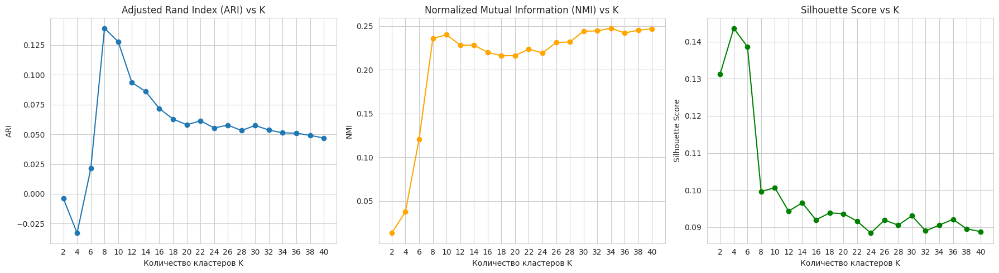

In [78]:
draw_kmeans_plot(virus_data_nt_50m, 'Kingdom')

Число уникальных меток 22
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=0.0349, NMI=0.0840, Silhouette Score=0.1312
K=4: ARI=0.0398, NMI=0.0905, Silhouette Score=0.1436
K=6: ARI=0.0671, NMI=0.1410, Silhouette Score=0.1386
K=8: ARI=0.1338, NMI=0.2099, Silhouette Score=0.0996
K=10: ARI=0.1230, NMI=0.2094, Silhouette Score=0.1006
K=12: ARI=0.1041, NMI=0.1961, Silhouette Score=0.0943
K=14: ARI=0.1086, NMI=0.2091, Silhouette Score=0.0966
K=16: ARI=0.0888, NMI=0.1953, Silhouette Score=0.0919
K=18: ARI=0.0880, NMI=0.2053, Silhouette Score=0.0939
K=20: ARI=0.0898, NMI=0.2108, Silhouette Score=0.0936
K=22: ARI=0.0909, NMI=0.2143, Silhouette Score=0.0916
K=24: ARI=0.0877, NMI=0.2159, Silhouette Score=0.0884
K=26: ARI=0.0884, NMI=0.2231, Silhouette Score=0.0919
K=28: ARI=0.0880, NMI=0.2241, Silhouette Score=0.0905
K=30: ARI=0.0855, NMI=0.2338, Silhouette Score=0.0931
K=32: ARI=0.0870, NMI=0.2352, Silhouette Score=0.0890
K=34: ARI=0.0845, NMI=0.2391, Silhouette Score=0.0906
K=36: 

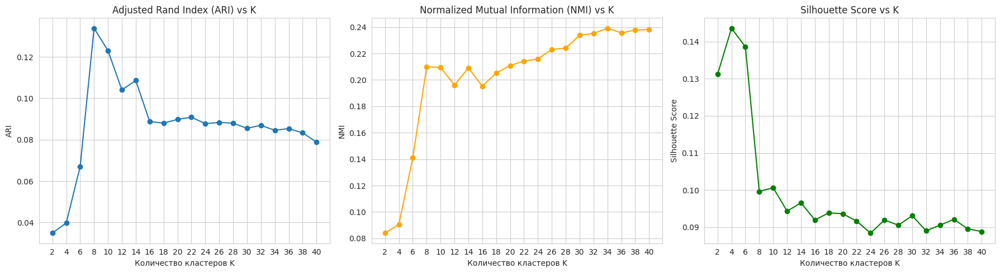

In [79]:
draw_kmeans_plot(virus_data_nt_50m, 'Host source')

In [ ]:
# draw_kmeans_plot(virus_data_nt_50m, 'Family', k_min = 250, k_max = 400, step = 15)

/home/ledneva/anaconda3/envs/myenv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


10


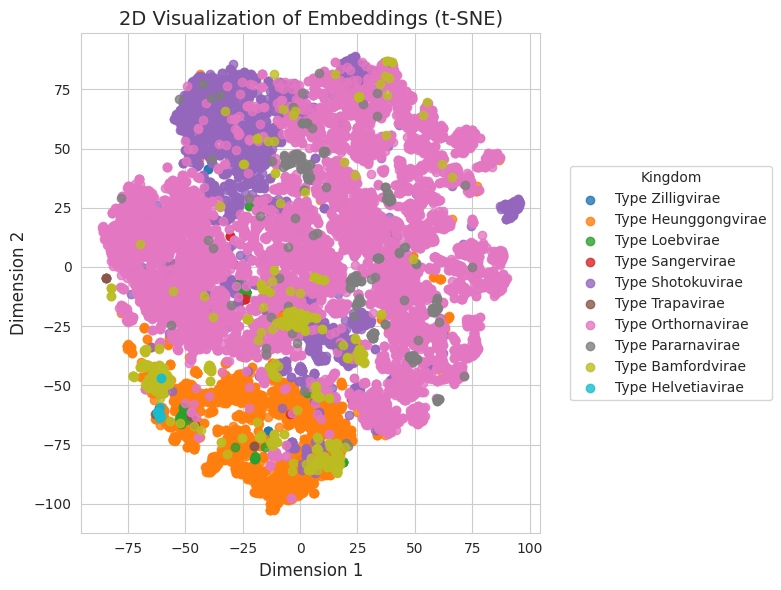

In [80]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_nt_50m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_nt_50m['x'] = reduced_embeddings[:, 0]
virus_data_nt_50m['y'] = reduced_embeddings[:, 1]

# Plot the reduced embeddings
plt.figure(figsize=(8, 6))

unique_types = virus_data_nt_50m['Kingdom'].unique()
print(len(unique_types))

for t in unique_types:
    subset = virus_data_nt_50m[virus_data_nt_50m['Kingdom'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'Type {t}', alpha=0.8)

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Kingdom', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


310


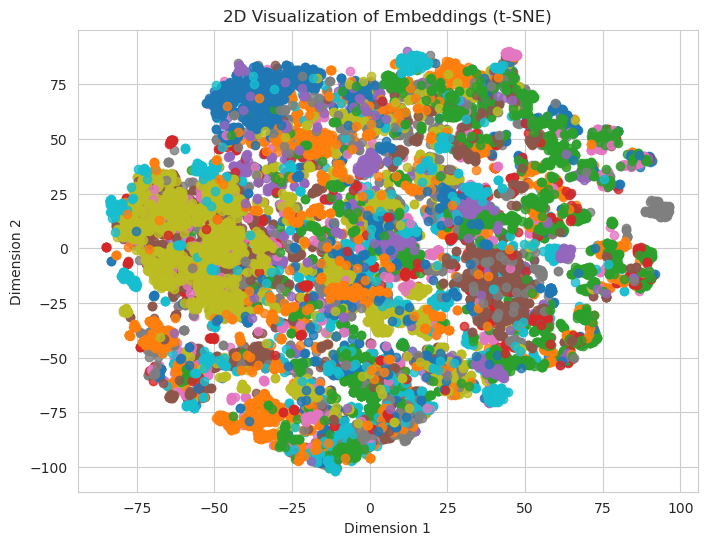

In [25]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_nt_50m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_nt_50m['x'] = reduced_embeddings[:, 0]
virus_data_nt_50m['y'] = reduced_embeddings[:, 1]

# Plot the reduced embeddings
plt.figure(figsize=(8, 6))

unique_types = virus_data_nt_50m['Family'].unique()
print(len(unique_types))

for t in unique_types:
    subset = virus_data_nt_50m[virus_data_nt_50m['Family'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'Type {t}', alpha=0.8)

plt.title('2D Visualization of Embeddings (t-SNE)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
# plt.legend()  # Uncomment if you want the legend
plt.grid(True)
plt.show()

/tmp/ipykernel_1359703/4003537647.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


22


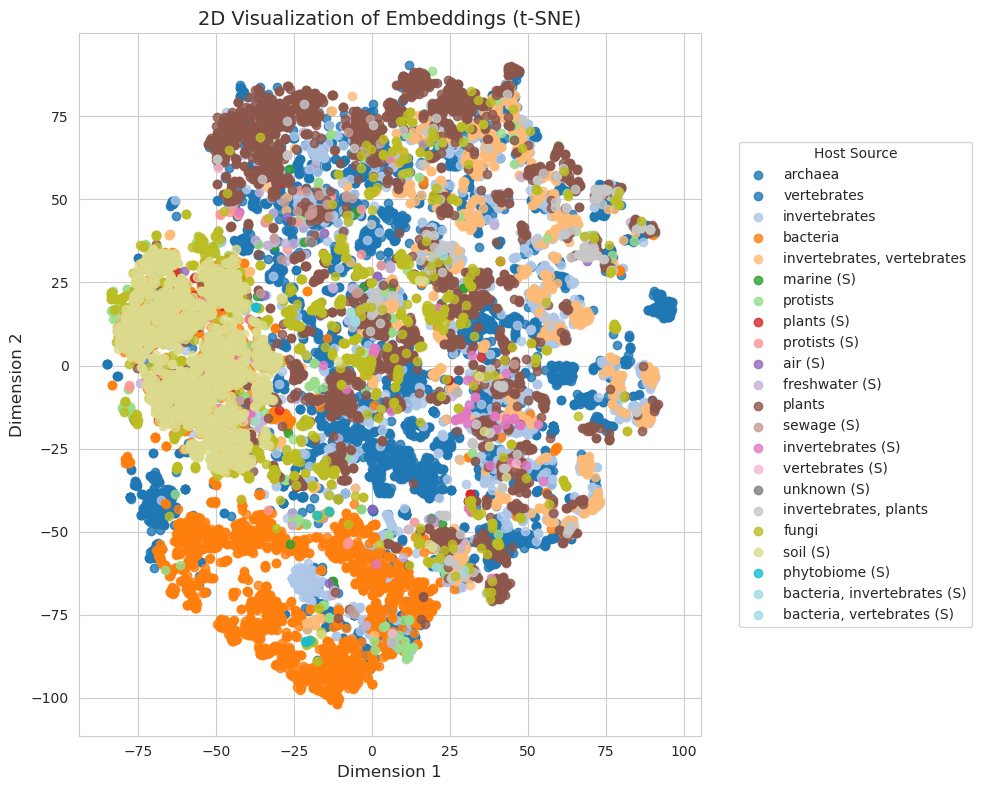

In [28]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_nt_50m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_nt_50m['x'] = reduced_embeddings[:, 0]
virus_data_nt_50m['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_nt_50m['Host source'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_nt_50m[virus_data_nt_50m['Host source'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Host Source', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


# InstaDeepAI/nucleotide-transformer-v2-500m-multi-species

In [ ]:
from transformers import AutoTokenizer, AutoModelForMaskedLM
import torch

tokenizer = AutoTokenizer.from_pretrained("InstaDeepAI/nucleotide-transformer-v2-500m-multi-species", trust_remote_code=True)
model = AutoModelForMaskedLM.from_pretrained("InstaDeepAI/nucleotide-transformer-v2-500m-multi-species", trust_remote_code=True).half().to("cuda")

max_length = tokenizer.model_max_length

In [ ]:
max_length

In [ ]:
# Параметры
batch_size = 4  # Настройте в соответствии с памятью GPU

# Настройка устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Создание датасета и загрузчика данных
dataset = SequenceDataset(record_values, tokenizer, max_length)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

# Перенос модели на устройство и установка режима оценки
model.to(device)
model.eval()

embeds = []

# Отключение вычисления градиентов
with torch.no_grad():
    for batch in tqdm(dataloader, desc="Processing Batches"):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)

        # Использование смешанной точности (опционально)
        with autocast():
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask,
                encoder_attention_mask=attention_mask,
                output_hidden_states=True
            )

        # Получение последнего скрытого слоя
        embeddings = outputs.hidden_states[-1]  # Форма: (batch_size, seq_length, hidden_size)

        # Среднее пуллирование с учетом маски внимания
        attention_mask_expanded = attention_mask.unsqueeze(-1)  # Форма: (batch_size, seq_length, 1)
        sum_embeddings = torch.sum(embeddings * attention_mask_expanded, dim=1)  # Форма: (batch_size, hidden_size)
        sum_mask = torch.clamp(attention_mask_expanded.sum(dim=1), min=1e-9)  # Избегаем деления на ноль
        mean_embeddings = sum_embeddings / sum_mask  # Форма: (batch_size, hidden_size)

        # Перенос на CPU и преобразование в NumPy
        embeds.append(mean_embeddings.cpu().numpy())

# Объединение всех эмбеддингов в один массив NumPy
embeds = np.vstack(embeds)

# Опционально, очистка кэша CUDA после обработки
torch.cuda.empty_cache()

In [ ]:
import numpy as np
np.save("embeds_nucleotide-transformer-v2-500m-multi-species.npy", embeds)

In [81]:
import numpy as np

embeds = np.load("embeds_nucleotide-transformer-v2-500m-multi-species.npy").reshape((19758, 1024))
np.array(embeds).shape

(19758, 1024)

In [82]:
embeds_dict = dict(zip(record_ids, embeds))

In [83]:
embedding_matrix = [embeds_dict.get(id_, None) for id_ in virus_data.dropna()['Virus GENBANK accession']]

In [84]:
virus_data_nt_500m = virus_data.dropna().copy()
virus_data_nt_500m['embeds'] = embedding_matrix
virus_data_nt_500m = virus_data_nt_500m.dropna(subset = ['embeds'])

In [85]:
virus_data_nt_500m

,Isolate ID,Family,Genus,Species,Host source,Virus GENBANK accession,Kingdom,embeds
0,1000002,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus beppuense,archaea,MH447526,Zilligvirae,"[-0.30414248, 0.14639507, -0.15877867, 0.26132..."
1,1000001,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus umijigokuense,archaea,MK064563,Zilligvirae,"[-0.09400347, 0.075822115, -0.11804694, 0.1842..."
2,1000003,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus acidiani,archaea,AM087120,Zilligvirae,"[-0.2686602, -0.023195595, 0.13192633, -0.0156..."
3,1000008,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus hveragerdiense,archaea,AF440571,Zilligvirae,"[-0.2872354, 0.07667121, 0.13729207, -0.042831..."
4,1000005,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus pezzuloense,archaea,AM087122,Zilligvirae,"[-0.3157323, 0.020014174, 0.15694581, 0.087193..."
...,...,...,...,...,...,...,...,...
16515,1004826,Simuloviridae,Yingchengvirus,Yingchengvirus sinense,archaea,AY048850,Helvetiavirae,"[-0.11663449, 0.03718637, -0.009566627, 0.0361..."
16516,1004828,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus helsinkii,archaea,JN968479,Helvetiavirae,"[-0.13675173, -0.054099333, -0.1821965, 0.0544..."
16517,1004829,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus pinkense,archaea,KC252997,Helvetiavirae,"[-0.04080242, 0.02969501, -0.0045607323, 0.032..."
16518,1004830,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus serpentinense,archaea,AY950802,Helvetiavirae,"[-0.10666169, 0.04968297, -0.040435642, -0.073..."


In [86]:
np.stack(virus_data_nt_500m['embeds'].values).shape

(16416, 1024)

Число уникальных меток 10
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=-0.0573, NMI=0.0225, Silhouette Score=0.1471
K=4: ARI=0.0209, NMI=0.0865, Silhouette Score=0.1763
K=6: ARI=0.0475, NMI=0.1573, Silhouette Score=0.1663
K=8: ARI=0.0656, NMI=0.1784, Silhouette Score=0.1452
K=10: ARI=0.0704, NMI=0.2032, Silhouette Score=0.1281
K=12: ARI=0.0941, NMI=0.2550, Silhouette Score=0.1360
K=14: ARI=0.0824, NMI=0.2539, Silhouette Score=0.1346
K=16: ARI=0.0785, NMI=0.2516, Silhouette Score=0.1381
K=18: ARI=0.0779, NMI=0.2524, Silhouette Score=0.1337
K=20: ARI=0.0689, NMI=0.2497, Silhouette Score=0.1295
K=22: ARI=0.0639, NMI=0.2502, Silhouette Score=0.1298
K=24: ARI=0.0586, NMI=0.2490, Silhouette Score=0.1263
K=26: ARI=0.0575, NMI=0.2609, Silhouette Score=0.1263
K=28: ARI=0.0528, NMI=0.2557, Silhouette Score=0.1236
K=30: ARI=0.0528, NMI=0.2675, Silhouette Score=0.1257
K=32: ARI=0.0506, NMI=0.2666, Silhouette Score=0.1273
K=34: ARI=0.0484, NMI=0.2716, Silhouette Score=0.1200
K=36:

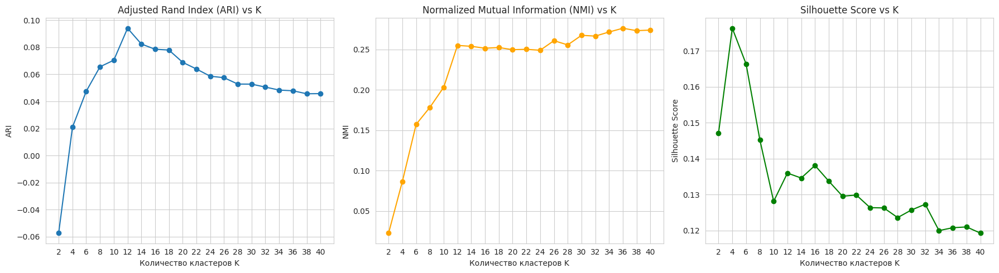

In [87]:
draw_kmeans_plot(virus_data_nt_500m, 'Kingdom')

Число уникальных меток 22
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=0.0087, NMI=0.0097, Silhouette Score=0.1471
K=4: ARI=0.0221, NMI=0.0359, Silhouette Score=0.1763
K=6: ARI=0.0851, NMI=0.1243, Silhouette Score=0.1663
K=8: ARI=0.0835, NMI=0.1465, Silhouette Score=0.1452
K=10: ARI=0.0956, NMI=0.1792, Silhouette Score=0.1281
K=12: ARI=0.1256, NMI=0.2202, Silhouette Score=0.1360
K=14: ARI=0.1236, NMI=0.2159, Silhouette Score=0.1346
K=16: ARI=0.1253, NMI=0.2202, Silhouette Score=0.1381
K=18: ARI=0.1003, NMI=0.2142, Silhouette Score=0.1337
K=20: ARI=0.0998, NMI=0.2172, Silhouette Score=0.1295
K=22: ARI=0.1003, NMI=0.2222, Silhouette Score=0.1298
K=24: ARI=0.1013, NMI=0.2263, Silhouette Score=0.1263
K=26: ARI=0.0999, NMI=0.2364, Silhouette Score=0.1263
K=28: ARI=0.0979, NMI=0.2359, Silhouette Score=0.1236
K=30: ARI=0.0924, NMI=0.2450, Silhouette Score=0.1257
K=32: ARI=0.0919, NMI=0.2461, Silhouette Score=0.1273
K=34: ARI=0.0872, NMI=0.2546, Silhouette Score=0.1200
K=36: 

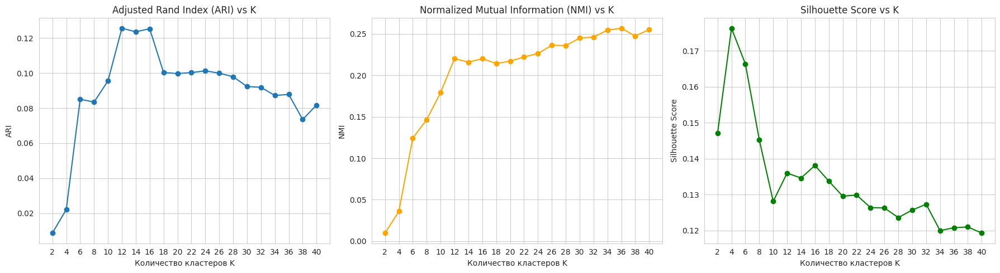

In [88]:
draw_kmeans_plot(virus_data_nt_500m, 'Host source')

In [ ]:
# draw_kmeans_plot(virus_data_nt_500m, 'Family', k_min = 250, k_max = 400, step = 15)

/home/ledneva/anaconda3/envs/myenv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipykernel_525689/612798611.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


10


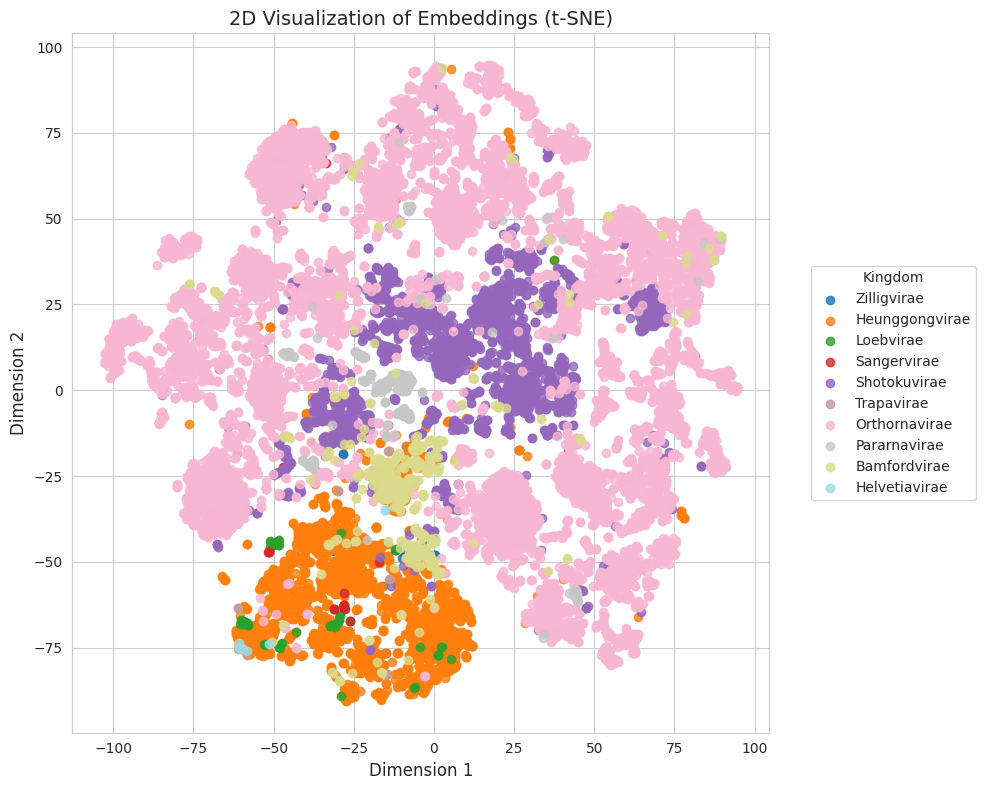

In [89]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_nt_500m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_nt_500m['x'] = reduced_embeddings[:, 0]
virus_data_nt_500m['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_nt_500m['Kingdom'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_nt_500m[virus_data_nt_500m['Kingdom'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Kingdom', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_1359703/4236569204.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


310


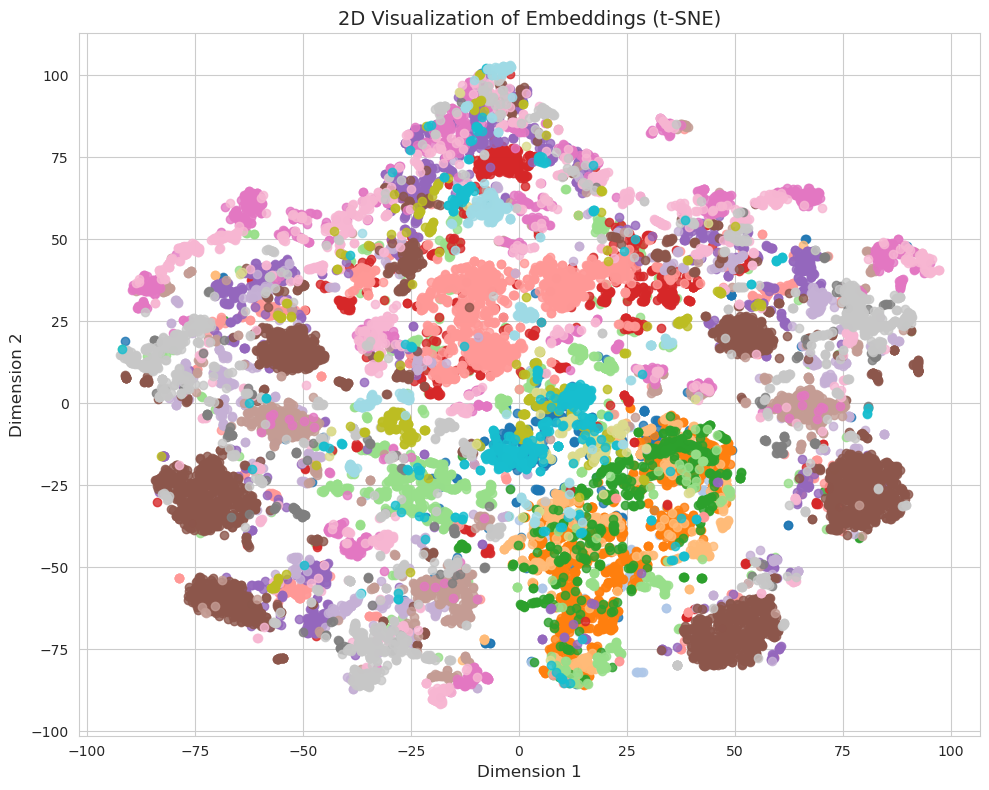

In [44]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_nt_500m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_nt_500m['x'] = reduced_embeddings[:, 0]
virus_data_nt_500m['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_nt_500m['Family'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_nt_500m[virus_data_nt_500m['Family'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
# plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Family', fontsize=10)
plt.grid(True)
plt.tight_layout()
# Show the plot
plt.show()


/tmp/ipykernel_1359703/1082159590.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


22


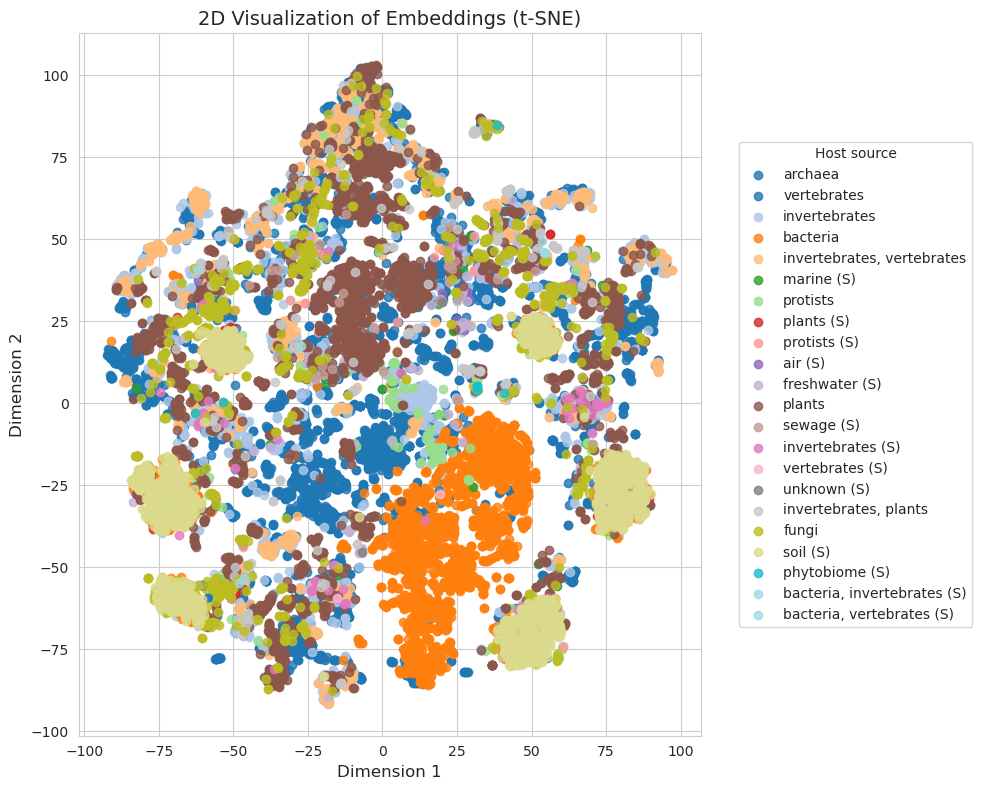

In [45]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_nt_500m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_nt_500m['x'] = reduced_embeddings[:, 0]
virus_data_nt_500m['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_nt_500m['Host source'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_nt_500m[virus_data_nt_500m['Host source'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Host source', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


# gena-lm-bigbird-base-t2t

In [20]:
from transformers import AutoTokenizer, AutoModelForMaskedLM
import torch

tokenizer = AutoTokenizer.from_pretrained("AIRI-Institute/gena-lm-bigbird-base-t2t", trust_remote_code=True)
model = AutoModelForMaskedLM.from_pretrained("AIRI-Institute/gena-lm-bigbird-base-t2t", trust_remote_code=True).half().to("cuda")

max_length = tokenizer.model_max_length

tokenizer_config.json:   0%|          | 0.00/46.0 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.48M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/home/ledneva/anaconda3/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


config.json:   0%|          | 0.00/769 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/456M [00:00<?, ?B/s]

In [28]:
max_length = 4_096

In [ ]:
# Параметры
batch_size = 4  # Настройте в соответствии с памятью GPU

# Настройка устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Создание датасета и загрузчика данных
dataset = SequenceDataset(record_values, tokenizer, max_length)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

# Перенос модели на устройство и установка режима оценки
model.to(device)
model.eval()

embeds = []

# Отключение вычисления градиентов
with torch.no_grad():
    for batch in tqdm(dataloader, desc="Processing Batches"):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)

        # Использование смешанной точности (опционально)
        with autocast():
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask,
                encoder_attention_mask=attention_mask,
                output_hidden_states=True
            )

        # Получение последнего скрытого слоя
        embeddings = outputs.hidden_states[-1]  # Форма: (batch_size, seq_length, hidden_size)

        # Среднее пуллирование с учетом маски внимания
        attention_mask_expanded = attention_mask.unsqueeze(-1)  # Форма: (batch_size, seq_length, 1)
        sum_embeddings = torch.sum(embeddings * attention_mask_expanded, dim=1)  # Форма: (batch_size, hidden_size)
        sum_mask = torch.clamp(attention_mask_expanded.sum(dim=1), min=1e-9)  # Избегаем деления на ноль
        mean_embeddings = sum_embeddings / sum_mask  # Форма: (batch_size, hidden_size)

        # Перенос на CPU и преобразование в NumPy
        embeds.append(mean_embeddings.cpu().numpy())

# Объединение всех эмбеддингов в один массив NumPy
embeds = np.vstack(embeds)

# Опционально, очистка кэша CUDA после обработки
torch.cuda.empty_cache()

Processing Batches:   0%|                                                       | 0/4940 [00:00<?, ?it/s]/tmp/ipykernel_3874680/2355818010.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Processing Batches:   9%|███▋                                       | 425/4940 [07:21<1:36:05,  1.28s/it]

In [ ]:
import numpy as np
np.save("embeds_gena-lm-bigbird-base-t2t.npy", embeds)

In [90]:
import numpy as np

embeds = np.load("embeds_gena-lm-bigbird-base-t2t.npy").reshape((19758, 768))
np.array(embeds).shape

(19758, 768)

In [91]:
embeds_dict = dict(zip(record_ids, embeds))

In [92]:
embedding_matrix = [embeds_dict.get(id_, None) for id_ in virus_data.dropna()['Virus GENBANK accession']]

In [93]:
virus_data_lm_bigbird = virus_data.dropna().copy()
virus_data_lm_bigbird['embeds'] = embedding_matrix
virus_data_lm_bigbird = virus_data_lm_bigbird.dropna(subset = ['embeds'])

In [94]:
virus_data_lm_bigbird

,Isolate ID,Family,Genus,Species,Host source,Virus GENBANK accession,Kingdom,embeds
0,1000002,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus beppuense,archaea,MH447526,Zilligvirae,"[-0.2544343, 0.050081633, -0.27496007, -0.4911..."
1,1000001,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus umijigokuense,archaea,MK064563,Zilligvirae,"[-0.3237072, 0.09855908, -0.3328973, -0.408886..."
2,1000003,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus acidiani,archaea,AM087120,Zilligvirae,"[-0.26419672, 0.0008829748, -0.24718729, -0.39..."
3,1000008,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus hveragerdiense,archaea,AF440571,Zilligvirae,"[-0.27576116, 0.053702764, -0.2848021, -0.3919..."
4,1000005,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus pezzuloense,archaea,AM087122,Zilligvirae,"[-0.21812573, 0.030987248, -0.28151935, -0.454..."
...,...,...,...,...,...,...,...,...
16515,1004826,Simuloviridae,Yingchengvirus,Yingchengvirus sinense,archaea,AY048850,Helvetiavirae,"[-0.2191258, 0.35155737, -0.32841074, -0.50599..."
16516,1004828,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus helsinkii,archaea,JN968479,Helvetiavirae,"[-0.20906828, 0.30677179, -0.42011186, -0.6487..."
16517,1004829,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus pinkense,archaea,KC252997,Helvetiavirae,"[-0.20161496, 0.19691642, -0.3329841, -0.68323..."
16518,1004830,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus serpentinense,archaea,AY950802,Helvetiavirae,"[-0.17183009, 0.18494482, -0.34623846, -0.6564..."


In [95]:
np.stack(virus_data_lm_bigbird['embeds'].values).shape

(16416, 768)

Число уникальных меток 10
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=0.4441, NMI=0.4837, Silhouette Score=0.4040
K=4: ARI=0.1948, NMI=0.3318, Silhouette Score=0.1581
K=6: ARI=0.1390, NMI=0.2948, Silhouette Score=0.1215
K=8: ARI=0.1273, NMI=0.2876, Silhouette Score=0.1153
K=10: ARI=0.1110, NMI=0.2734, Silhouette Score=0.1065
K=12: ARI=0.0934, NMI=0.2621, Silhouette Score=0.0996
K=14: ARI=0.0880, NMI=0.2564, Silhouette Score=0.0981
K=16: ARI=0.0787, NMI=0.2546, Silhouette Score=0.0818
K=18: ARI=0.0820, NMI=0.2614, Silhouette Score=0.0812
K=20: ARI=0.0765, NMI=0.2614, Silhouette Score=0.0777
K=22: ARI=0.0718, NMI=0.2560, Silhouette Score=0.0756
K=24: ARI=0.0696, NMI=0.2546, Silhouette Score=0.0759
K=26: ARI=0.0681, NMI=0.2546, Silhouette Score=0.0759
K=28: ARI=0.0625, NMI=0.2521, Silhouette Score=0.0730
K=30: ARI=0.0615, NMI=0.2515, Silhouette Score=0.0750
K=32: ARI=0.0585, NMI=0.2485, Silhouette Score=0.0718
K=34: ARI=0.0489, NMI=0.2430, Silhouette Score=0.0625
K=36: 

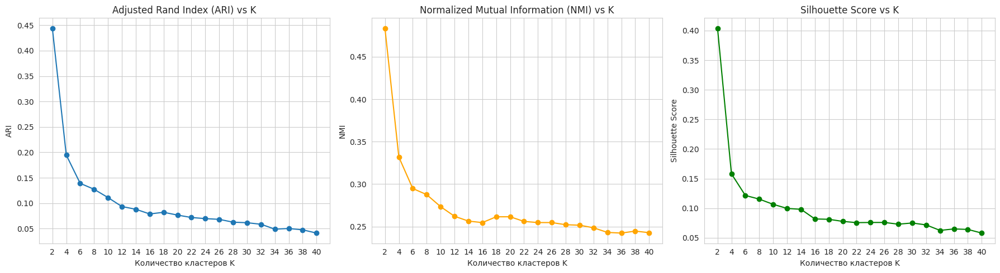

In [96]:
draw_kmeans_plot(virus_data_lm_bigbird, 'Kingdom')

Число уникальных меток 22
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=0.0451, NMI=0.1655, Silhouette Score=0.4040
K=4: ARI=0.1599, NMI=0.2530, Silhouette Score=0.1581
K=6: ARI=0.1137, NMI=0.2196, Silhouette Score=0.1215
K=8: ARI=0.1272, NMI=0.2352, Silhouette Score=0.1153
K=10: ARI=0.1222, NMI=0.2392, Silhouette Score=0.1065
K=12: ARI=0.1299, NMI=0.2384, Silhouette Score=0.0996
K=14: ARI=0.1261, NMI=0.2373, Silhouette Score=0.0981
K=16: ARI=0.1146, NMI=0.2365, Silhouette Score=0.0818
K=18: ARI=0.1045, NMI=0.2324, Silhouette Score=0.0812
K=20: ARI=0.1038, NMI=0.2364, Silhouette Score=0.0777
K=22: ARI=0.0954, NMI=0.2330, Silhouette Score=0.0756
K=24: ARI=0.0978, NMI=0.2386, Silhouette Score=0.0759
K=26: ARI=0.0922, NMI=0.2391, Silhouette Score=0.0759
K=28: ARI=0.0902, NMI=0.2424, Silhouette Score=0.0730
K=30: ARI=0.0904, NMI=0.2425, Silhouette Score=0.0750
K=32: ARI=0.0855, NMI=0.2424, Silhouette Score=0.0718
K=34: ARI=0.0835, NMI=0.2430, Silhouette Score=0.0625
K=36: 

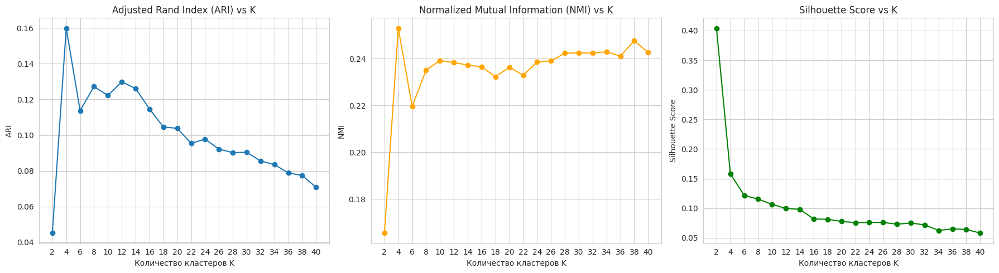

In [97]:
draw_kmeans_plot(virus_data_lm_bigbird, 'Host source')

In [98]:
# draw_kmeans_plot(virus_data_lm_bigbird, 'Family', k_min = 250, k_max = 400, step = 15)

/home/ledneva/anaconda3/envs/myenv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipykernel_525689/2109435366.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


10


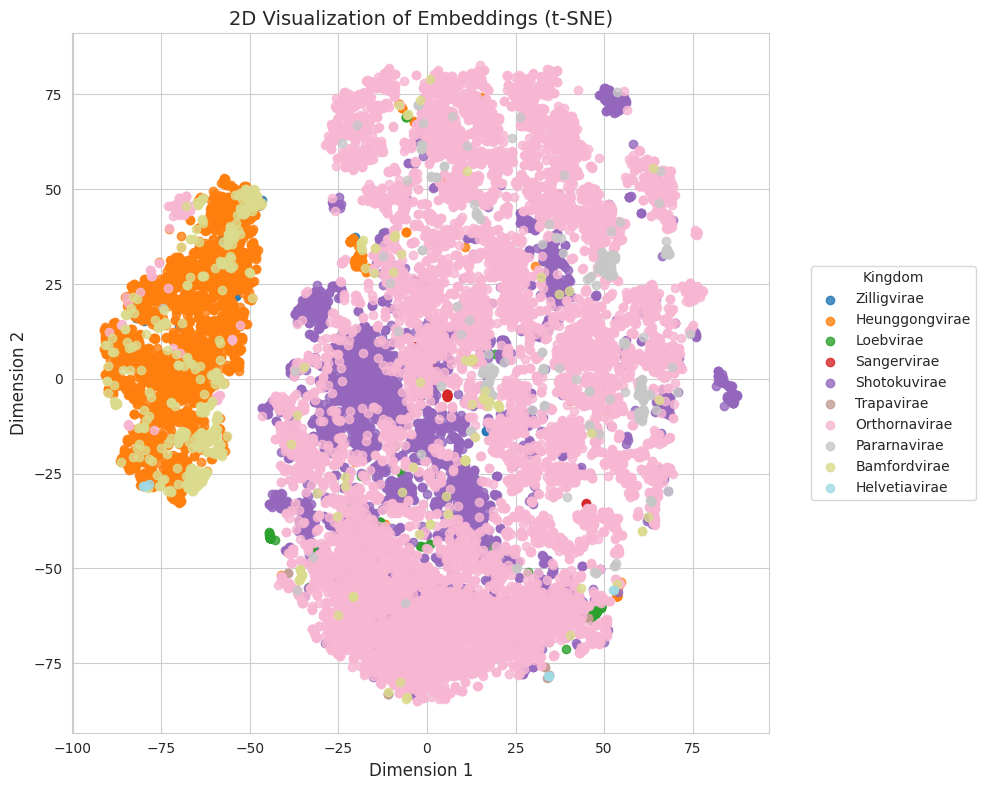

In [99]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_lm_bigbird['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_lm_bigbird['x'] = reduced_embeddings[:, 0]
virus_data_lm_bigbird['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_lm_bigbird['Kingdom'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_lm_bigbird[virus_data_lm_bigbird['Kingdom'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Kingdom', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_1359703/3408258972.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


310


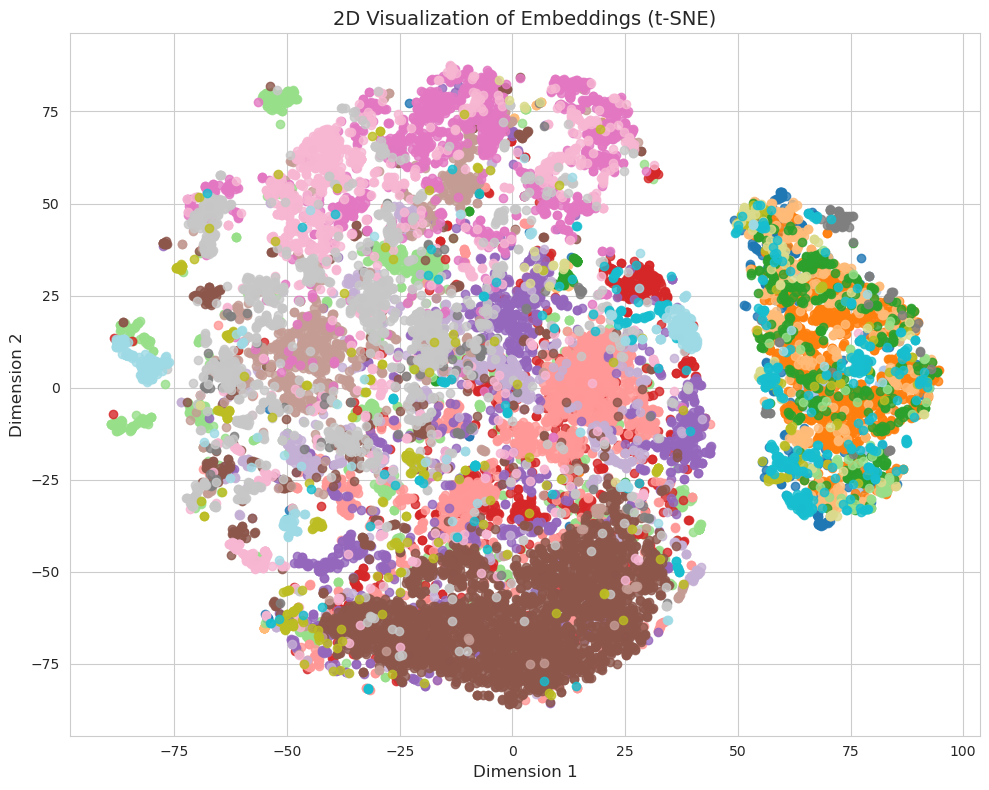

In [52]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_lm_bigbird['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_lm_bigbird['x'] = reduced_embeddings[:, 0]
virus_data_lm_bigbird['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_lm_bigbird['Family'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_lm_bigbird[virus_data_lm_bigbird['Family'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
# plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Family', fontsize=10)
plt.grid(True)
plt.tight_layout()
# Show the plot
plt.show()


/tmp/ipykernel_1359703/3177426293.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


22


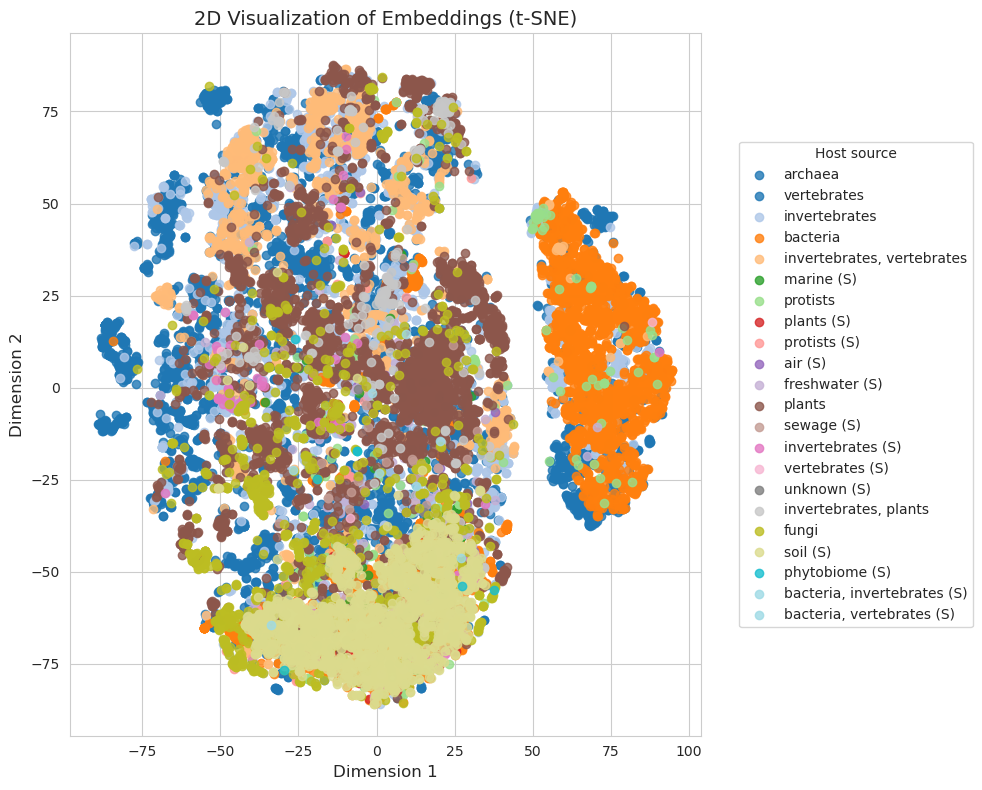

In [53]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_lm_bigbird['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_lm_bigbird['x'] = reduced_embeddings[:, 0]
virus_data_lm_bigbird['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_lm_bigbird['Host source'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_lm_bigbird[virus_data_lm_bigbird['Host source'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Host source', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


# AIRI-Institute/gena-lm-bert-large-t2t

In [ ]:
from transformers import AutoTokenizer, AutoModelForMaskedLM
import torch

tokenizer = AutoTokenizer.from_pretrained("AIRI-Institute/gena-lm-bert-large-t2t", trust_remote_code=True)
model = AutoModelForMaskedLM.from_pretrained("AIRI-Institute/gena-lm-bert-large-t2t", trust_remote_code=True).half().to("cuda")

max_length = tokenizer.model_max_length

In [ ]:
max_length = 512

In [ ]:
# Параметры
batch_size = 4  # Настройте в соответствии с памятью GPU

# Настройка устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Создание датасета и загрузчика данных
dataset = SequenceDataset(record_values, tokenizer, max_length)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

# Перенос модели на устройство и установка режима оценки
model.to(device)
model.eval()

embeds = []

# Отключение вычисления градиентов
with torch.no_grad():
    for batch in tqdm(dataloader, desc="Processing Batches"):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)

        # Использование смешанной точности (опционально)
        with autocast():
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask,
                encoder_attention_mask=attention_mask,
                output_hidden_states=True
            )

        # Получение последнего скрытого слоя
        embeddings = outputs.hidden_states[-1]  # Форма: (batch_size, seq_length, hidden_size)

        # Среднее пуллирование с учетом маски внимания
        attention_mask_expanded = attention_mask.unsqueeze(-1)  # Форма: (batch_size, seq_length, 1)
        sum_embeddings = torch.sum(embeddings * attention_mask_expanded, dim=1)  # Форма: (batch_size, hidden_size)
        sum_mask = torch.clamp(attention_mask_expanded.sum(dim=1), min=1e-9)  # Избегаем деления на ноль
        mean_embeddings = sum_embeddings / sum_mask  # Форма: (batch_size, hidden_size)

        # Перенос на CPU и преобразование в NumPy
        embeds.append(mean_embeddings.cpu().numpy())

# Объединение всех эмбеддингов в один массив NumPy
embeds = np.vstack(embeds)

# Опционально, очистка кэша CUDA после обработки
torch.cuda.empty_cache()

In [ ]:
import numpy as np
np.save("embeds_gena-lm-bert-large-t2t.npy", embeds)

In [100]:
import numpy as np

embeds = np.load("embeds_gena-lm-bert-large-t2t.npy").reshape((19758, 1024))
np.array(embeds).shape

(19758, 1024)

In [101]:
embeds_dict = dict(zip(record_ids, embeds))

In [102]:
embedding_matrix = [embeds_dict.get(id_, None) for id_ in virus_data.dropna()['Virus GENBANK accession']]

In [103]:
virus_data_lm_bert_large = virus_data.dropna().copy()
virus_data_lm_bert_large['embeds'] = embedding_matrix
virus_data_lm_bert_large = virus_data_lm_bert_large.dropna(subset = ['embeds'])

In [104]:
virus_data_lm_bert_large

,Isolate ID,Family,Genus,Species,Host source,Virus GENBANK accession,Kingdom,embeds
0,1000002,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus beppuense,archaea,MH447526,Zilligvirae,"[-0.5985421, 0.5129128, -0.3369069, -0.2634931..."
1,1000001,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus umijigokuense,archaea,MK064563,Zilligvirae,"[-0.59807444, 0.51338196, -0.34035262, -0.2618..."
2,1000003,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus acidiani,archaea,AM087120,Zilligvirae,"[-0.59995294, 0.5120442, -0.3339143, -0.263054..."
3,1000008,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus hveragerdiense,archaea,AF440571,Zilligvirae,"[-0.5988606, 0.51551723, -0.34084845, -0.26461..."
4,1000005,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus pezzuloense,archaea,AM087122,Zilligvirae,"[-0.6006895, 0.5142358, -0.33999464, -0.265866..."
...,...,...,...,...,...,...,...,...
16515,1004826,Simuloviridae,Yingchengvirus,Yingchengvirus sinense,archaea,AY048850,Helvetiavirae,"[-0.6007355, 0.5131777, -0.3387391, -0.2639587..."
16516,1004828,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus helsinkii,archaea,JN968479,Helvetiavirae,"[-0.5985221, 0.51329726, -0.33913237, -0.26258..."
16517,1004829,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus pinkense,archaea,KC252997,Helvetiavirae,"[-0.60173947, 0.51073754, -0.32866636, -0.2673..."
16518,1004830,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus serpentinense,archaea,AY950802,Helvetiavirae,"[-0.60158676, 0.514688, -0.33886826, -0.265242..."


In [105]:
np.stack(virus_data_lm_bert_large['embeds'].values).shape

(16416, 1024)

Число уникальных меток 10
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=-0.0009, NMI=0.0002, Silhouette Score=0.9272
K=4: ARI=-0.0021, NMI=0.0013, Silhouette Score=0.8872
K=6: ARI=-0.0045, NMI=0.0017, Silhouette Score=0.7572
K=8: ARI=-0.0046, NMI=0.0020, Silhouette Score=0.7558
K=10: ARI=-0.0069, NMI=0.0019, Silhouette Score=0.5896
K=12: ARI=-0.0083, NMI=0.0021, Silhouette Score=0.5656
K=14: ARI=-0.0083, NMI=0.0026, Silhouette Score=0.5423
K=16: ARI=-0.0107, NMI=0.0031, Silhouette Score=0.4622
K=18: ARI=-0.0108, NMI=0.0033, Silhouette Score=0.4623
K=20: ARI=-0.0038, NMI=0.0028, Silhouette Score=0.2952
K=22: ARI=-0.0027, NMI=0.0030, Silhouette Score=0.2438
K=24: ARI=-0.0053, NMI=0.0031, Silhouette Score=0.2724
K=26: ARI=-0.0025, NMI=0.0030, Silhouette Score=0.2412
K=28: ARI=-0.0059, NMI=0.0037, Silhouette Score=0.2682
K=30: ARI=-0.0029, NMI=0.0034, Silhouette Score=0.2412
K=32: ARI=-0.0023, NMI=0.0040, Silhouette Score=0.2337
K=34: ARI=-0.0031, NMI=0.0038, Silhouette Sc

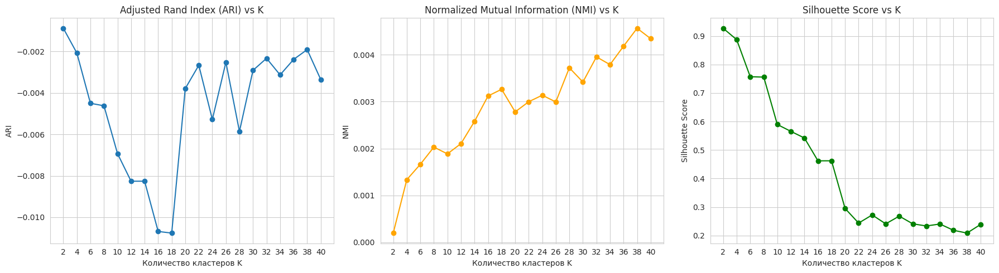

In [106]:
draw_kmeans_plot(virus_data_lm_bert_large, 'Kingdom')

Число уникальных меток 22
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=-0.0000, NMI=0.0007, Silhouette Score=0.9272
K=4: ARI=-0.0003, NMI=0.0013, Silhouette Score=0.8872
K=6: ARI=0.0013, NMI=0.0022, Silhouette Score=0.7572
K=8: ARI=0.0014, NMI=0.0026, Silhouette Score=0.7558
K=10: ARI=0.0021, NMI=0.0027, Silhouette Score=0.5896
K=12: ARI=0.0021, NMI=0.0034, Silhouette Score=0.5656
K=14: ARI=0.0020, NMI=0.0039, Silhouette Score=0.5423
K=16: ARI=0.0038, NMI=0.0045, Silhouette Score=0.4622
K=18: ARI=0.0038, NMI=0.0049, Silhouette Score=0.4623
K=20: ARI=0.0026, NMI=0.0050, Silhouette Score=0.2952
K=22: ARI=0.0024, NMI=0.0054, Silhouette Score=0.2438
K=24: ARI=0.0021, NMI=0.0054, Silhouette Score=0.2724
K=26: ARI=0.0024, NMI=0.0058, Silhouette Score=0.2412
K=28: ARI=0.0024, NMI=0.0059, Silhouette Score=0.2682
K=30: ARI=0.0023, NMI=0.0062, Silhouette Score=0.2412
K=32: ARI=0.0022, NMI=0.0064, Silhouette Score=0.2337
K=34: ARI=0.0026, NMI=0.0066, Silhouette Score=0.2406
K=36

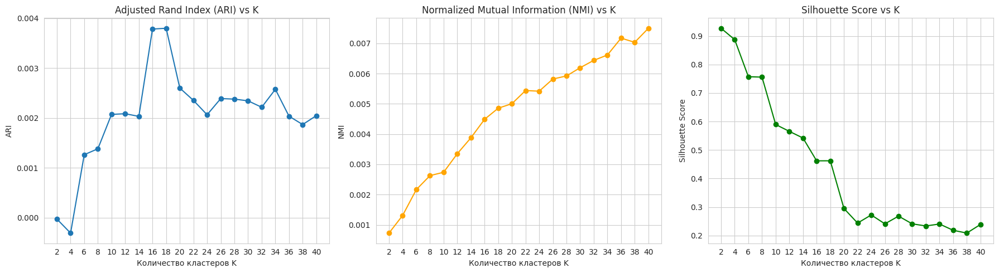

In [107]:
draw_kmeans_plot(virus_data_lm_bert_large, 'Host source')

In [108]:
# draw_kmeans_plot(virus_data_lm_bert_large, 'Family', k_min = 250, k_max = 400, step = 15)

/home/ledneva/anaconda3/envs/myenv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipykernel_525689/514548840.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


10


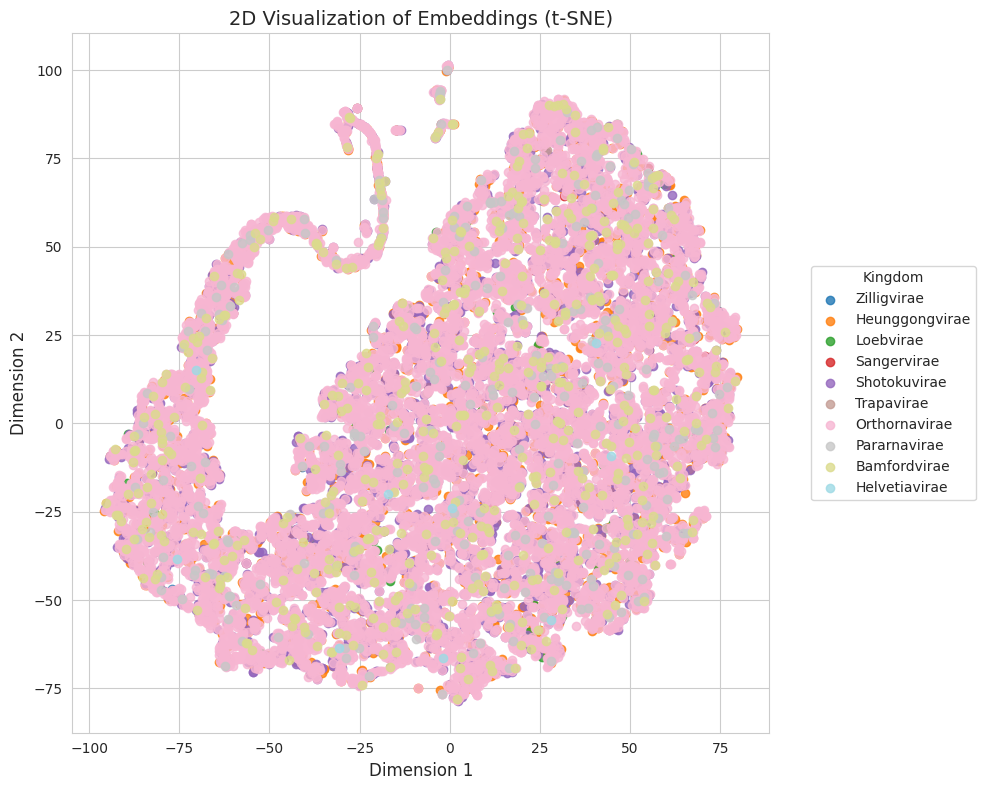

In [109]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_lm_bert_large['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_lm_bert_large['x'] = reduced_embeddings[:, 0]
virus_data_lm_bert_large['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_lm_bert_large['Kingdom'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_lm_bert_large[virus_data_lm_bert_large['Kingdom'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Kingdom', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

/tmp/ipykernel_1359703/565219265.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


310


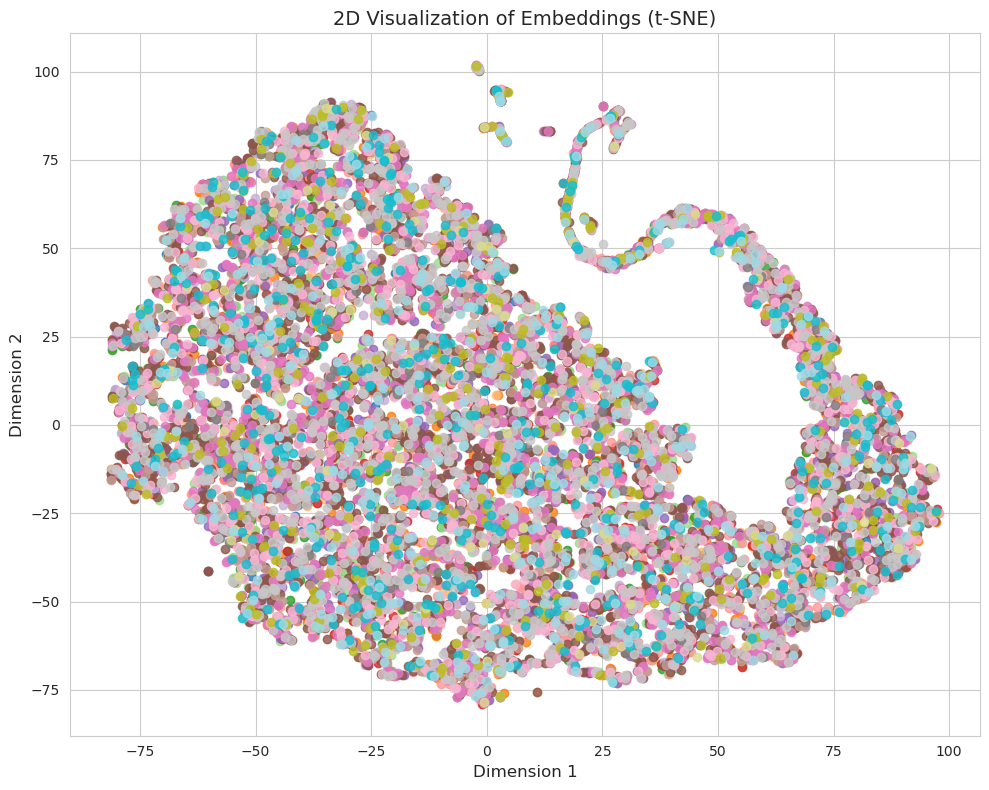

In [60]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_lm_bert_large['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_lm_bert_large['x'] = reduced_embeddings[:, 0]
virus_data_lm_bert_large['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_lm_bert_large['Family'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_lm_bert_large[virus_data_lm_bert_large['Family'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
# plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Family', fontsize=10)
plt.grid(True)
plt.tight_layout()
# Show the plot
plt.show()


/tmp/ipykernel_1359703/997888936.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


22


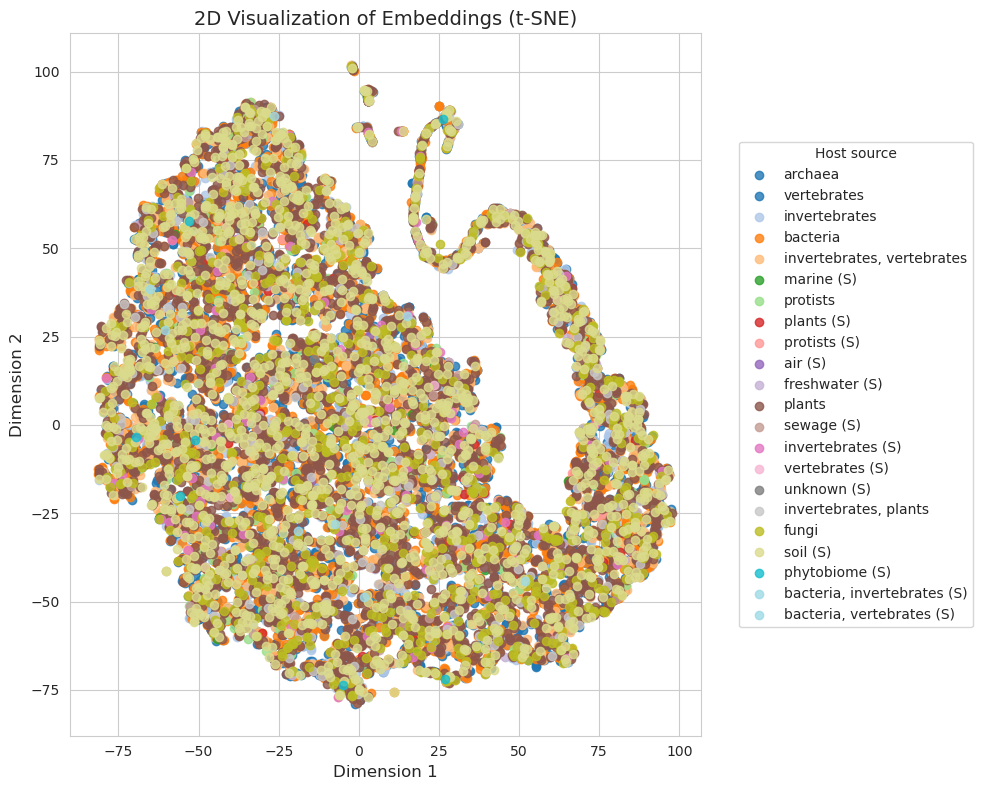

In [61]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_lm_bert_large['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_lm_bert_large['x'] = reduced_embeddings[:, 0]
virus_data_lm_bert_large['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_lm_bert_large['Host source'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_lm_bert_large[virus_data_lm_bert_large['Host source'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Host source', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


## DNA-BERT-2

In [17]:
from transformers import AutoTokenizer, AutoModel
from transformers.models.bert.configuration_bert import BertConfig

config = BertConfig.from_pretrained("zhihan1996/DNABERT-2-117M")
model = AutoModel.from_pretrained("zhihan1996/DNABERT-2-117M", trust_remote_code=True, config=config).half().to("cuda")
tokenizer = AutoTokenizer.from_pretrained("zhihan1996/DNABERT-2-117M", trust_remote_code=True)

max_length = tokenizer.model_max_length

/home/ledneva/.cache/huggingface/modules/transformers_modules/zhihan1996/DNABERT-2-117M/d064dece8a8b41d9fb8729fbe3435278786931f1/bert_layers.py:126: UserWarning: Unable to import Triton; defaulting MosaicBERT attention implementation to pytorch (this will reduce throughput when using this model).
  warnings.warn(
Some weights of BertModel were not initialized from the model checkpoint at zhihan1996/DNABERT-2-117M and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/home/ledneva/anaconda3/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  wa

In [18]:
max_length = 512

In [23]:
# Параметры
batch_size = 4  # Настройте в соответствии с памятью GPU

# Настройка устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Создание датасета и загрузчика данных
dataset = SequenceDataset(record_values, tokenizer, max_length)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

# Перенос модели на устройство и установка режима оценки
model.to(device)
model.eval()

embeds = []

# Отключение вычисления градиентов
with torch.no_grad():
    for batch in tqdm(dataloader, desc="Processing Batches"):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)

        # Использование смешанной точности (опционально)
        with autocast():
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask,
                encoder_attention_mask=attention_mask,
                output_hidden_states=True
            )

        # Получение последнего скрытого слоя
        embeddings = outputs[0]  # Форма: (batch_size, seq_length, hidden_size)

        # Среднее пуллирование с учетом маски внимания
        attention_mask_expanded = attention_mask.unsqueeze(-1)  # Форма: (batch_size, seq_length, 1)
        sum_embeddings = torch.sum(embeddings * attention_mask_expanded, dim=1)  # Форма: (batch_size, hidden_size)
        sum_mask = torch.clamp(attention_mask_expanded.sum(dim=1), min=1e-9)  # Избегаем деления на ноль
        mean_embeddings = sum_embeddings / sum_mask  # Форма: (batch_size, hidden_size)

        # Перенос на CPU и преобразование в NumPy
        embeds.append(mean_embeddings.cpu().numpy())

# Объединение всех эмбеддингов в один массив NumPy
embeds = np.vstack(embeds)

# Опционально, очистка кэша CUDA после обработки
torch.cuda.empty_cache()

Processing Batches:   0%|                                                       | 0/4940 [00:00<?, ?it/s]/tmp/ipykernel_389725/2052114748.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Processing Batches: 100%|████████████████████████████████████████████| 4940/4940 [13:01<00:00,  6.32it/s]


In [24]:
import numpy as np
np.save("embeds_dnabert-2-117m.npy", embeds)

In [110]:
import numpy as np

embeds = np.load("embeds_dnabert-2-117m.npy").reshape((19758, 768))
np.array(embeds).shape

(19758, 768)

In [111]:
embeds_dict = dict(zip(record_ids, embeds))

In [112]:
embedding_matrix = [embeds_dict.get(id_, None) for id_ in virus_data.dropna()['Virus GENBANK accession']]

In [113]:
virus_data_dnabert_2_117m = virus_data.dropna().copy()
virus_data_dnabert_2_117m['embeds'] = embedding_matrix
virus_data_dnabert_2_117m = virus_data_dnabert_2_117m.dropna(subset = ['embeds'])

In [114]:
virus_data_dnabert_2_117m

,Isolate ID,Family,Genus,Species,Host source,Virus GENBANK accession,Kingdom,embeds
0,1000002,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus beppuense,archaea,MH447526,Zilligvirae,"[-0.007814027, 0.07911669, 0.012519552, -0.142..."
1,1000001,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus umijigokuense,archaea,MK064563,Zilligvirae,"[-0.034920774, 0.055467665, 0.05084288, -0.146..."
2,1000003,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus acidiani,archaea,AM087120,Zilligvirae,"[-0.018732145, 0.1077634, 0.03883575, -0.11566..."
3,1000008,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus hveragerdiense,archaea,AF440571,Zilligvirae,"[-0.01149201, 0.09340118, 0.043876696, -0.1173..."
4,1000005,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus pezzuloense,archaea,AM087122,Zilligvirae,"[-0.019147566, 0.044976465, 0.024504883, -0.15..."
...,...,...,...,...,...,...,...,...
16515,1004826,Simuloviridae,Yingchengvirus,Yingchengvirus sinense,archaea,AY048850,Helvetiavirae,"[-0.06363042, 0.23738685, 0.12346024, -0.28468..."
16516,1004828,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus helsinkii,archaea,JN968479,Helvetiavirae,"[0.020979617, 0.300532, 0.17957187, -0.2637249..."
16517,1004829,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus pinkense,archaea,KC252997,Helvetiavirae,"[-0.119773954, 0.19384229, 0.13843516, 0.01225..."
16518,1004830,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus serpentinense,archaea,AY950802,Helvetiavirae,"[-0.21339518, -0.021264154, -0.09787456, 0.322..."


In [115]:
np.stack(virus_data_dnabert_2_117m['embeds'].values).shape

(16416, 768)

Число уникальных меток 10
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=-0.0909, NMI=0.0528, Silhouette Score=0.2424
K=4: ARI=0.0304, NMI=0.1271, Silhouette Score=0.2013
K=6: ARI=0.0155, NMI=0.1247, Silhouette Score=0.1312
K=8: ARI=0.0382, NMI=0.1264, Silhouette Score=0.0587
K=10: ARI=0.0378, NMI=0.1399, Silhouette Score=0.0652
K=12: ARI=0.0275, NMI=0.1363, Silhouette Score=0.0716
K=14: ARI=0.0246, NMI=0.1321, Silhouette Score=0.0527
K=16: ARI=0.0258, NMI=0.1368, Silhouette Score=0.0571
K=18: ARI=0.0251, NMI=0.1410, Silhouette Score=0.0612
K=20: ARI=0.0252, NMI=0.1398, Silhouette Score=0.0635
K=22: ARI=0.0271, NMI=0.1439, Silhouette Score=0.0581
K=24: ARI=0.0279, NMI=0.1458, Silhouette Score=0.0635
K=26: ARI=0.0295, NMI=0.1520, Silhouette Score=0.0522
K=28: ARI=0.0261, NMI=0.1427, Silhouette Score=0.0612
K=30: ARI=0.0232, NMI=0.1368, Silhouette Score=0.0580
K=32: ARI=0.0239, NMI=0.1406, Silhouette Score=0.0610
K=34: ARI=0.0232, NMI=0.1397, Silhouette Score=0.0624
K=36:

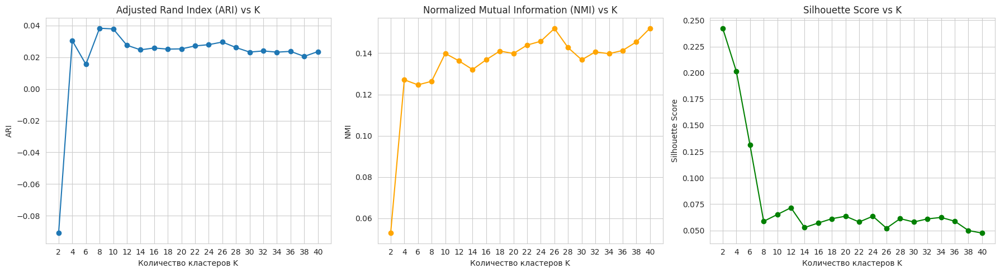

In [116]:
draw_kmeans_plot(virus_data_dnabert_2_117m, 'Kingdom')

Число уникальных меток 22
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=0.0312, NMI=0.0535, Silhouette Score=0.2424
K=4: ARI=0.0730, NMI=0.1125, Silhouette Score=0.2013
K=6: ARI=0.0779, NMI=0.1292, Silhouette Score=0.1312
K=8: ARI=0.0603, NMI=0.1310, Silhouette Score=0.0587
K=10: ARI=0.0609, NMI=0.1422, Silhouette Score=0.0652
K=12: ARI=0.0624, NMI=0.1389, Silhouette Score=0.0716
K=14: ARI=0.0620, NMI=0.1468, Silhouette Score=0.0527
K=16: ARI=0.0586, NMI=0.1496, Silhouette Score=0.0571
K=18: ARI=0.0604, NMI=0.1564, Silhouette Score=0.0612
K=20: ARI=0.0581, NMI=0.1622, Silhouette Score=0.0635
K=22: ARI=0.0641, NMI=0.1735, Silhouette Score=0.0581
K=24: ARI=0.0580, NMI=0.1738, Silhouette Score=0.0635
K=26: ARI=0.0601, NMI=0.1800, Silhouette Score=0.0522
K=28: ARI=0.0551, NMI=0.1751, Silhouette Score=0.0612
K=30: ARI=0.0531, NMI=0.1715, Silhouette Score=0.0580
K=32: ARI=0.0514, NMI=0.1731, Silhouette Score=0.0610
K=34: ARI=0.0514, NMI=0.1715, Silhouette Score=0.0624
K=36: 

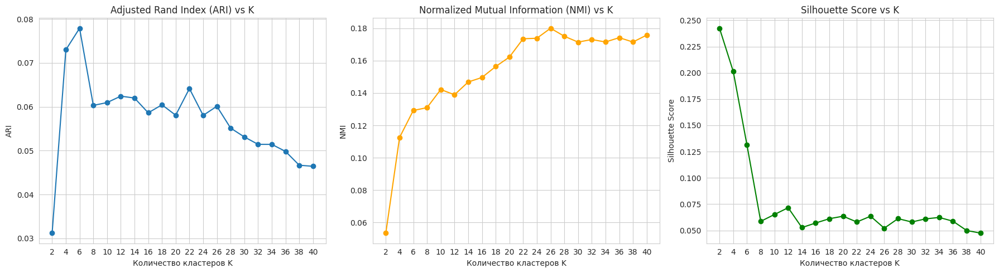

In [117]:
draw_kmeans_plot(virus_data_dnabert_2_117m, 'Host source')

In [ ]:
# draw_kmeans_plot(virus_data_dnabert_2_117m, 'Family', k_min = 250, k_max = 400, step = 15)

/home/ledneva/anaconda3/envs/myenv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipykernel_525689/2370916981.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


10


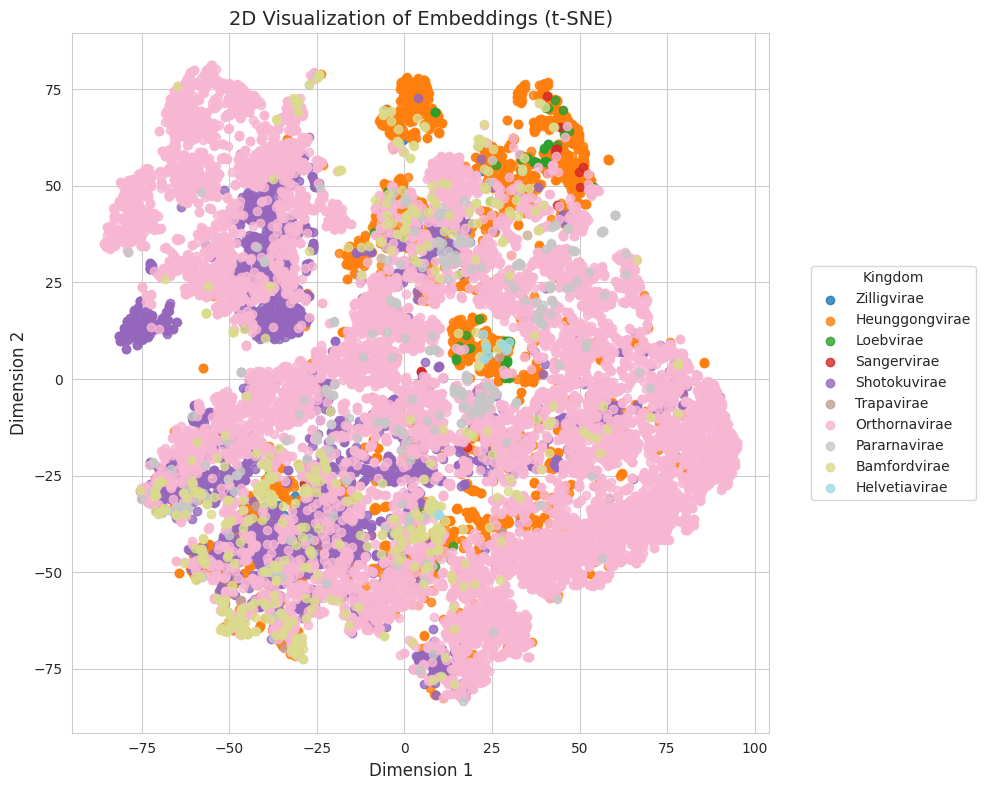

In [118]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_dnabert_2_117m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_dnabert_2_117m['x'] = reduced_embeddings[:, 0]
virus_data_dnabert_2_117m['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_dnabert_2_117m['Kingdom'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_dnabert_2_117m[virus_data_dnabert_2_117m['Kingdom'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Kingdom', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_1359703/2330024991.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


310


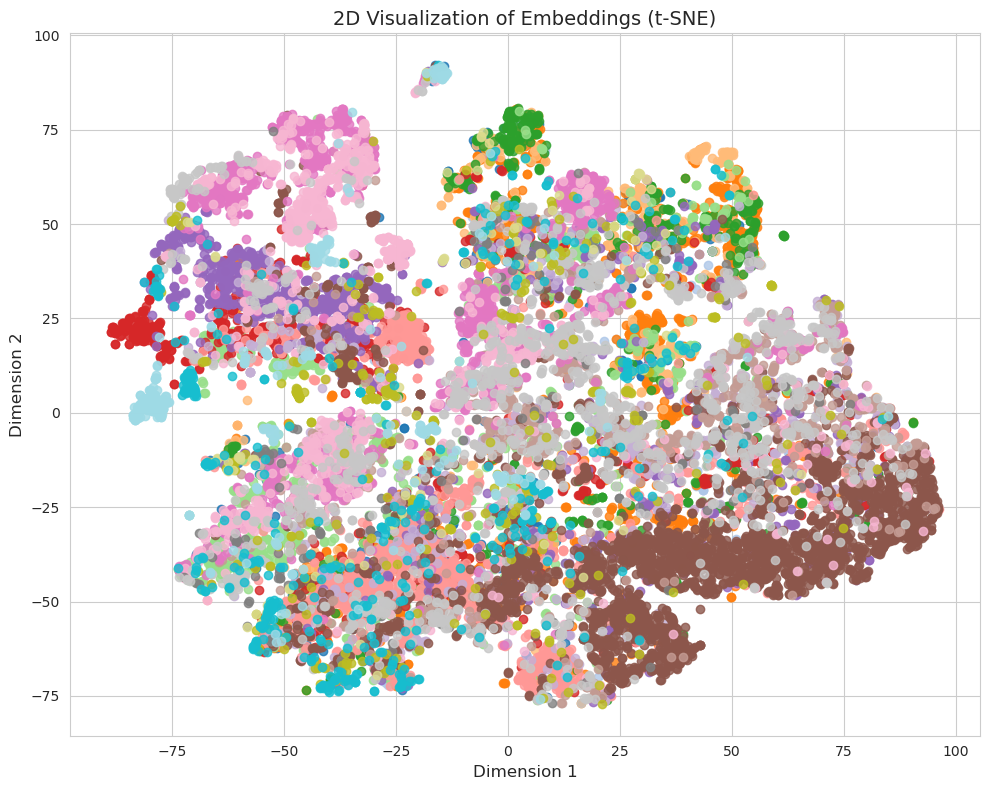

In [68]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_dnabert_2_117m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_dnabert_2_117m['x'] = reduced_embeddings[:, 0]
virus_data_dnabert_2_117m['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_dnabert_2_117m['Family'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_dnabert_2_117m[virus_data_dnabert_2_117m['Family'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
# plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Family', fontsize=10)
plt.grid(True)
plt.tight_layout()
# Show the plot
plt.show()


/tmp/ipykernel_1359703/808675613.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


22


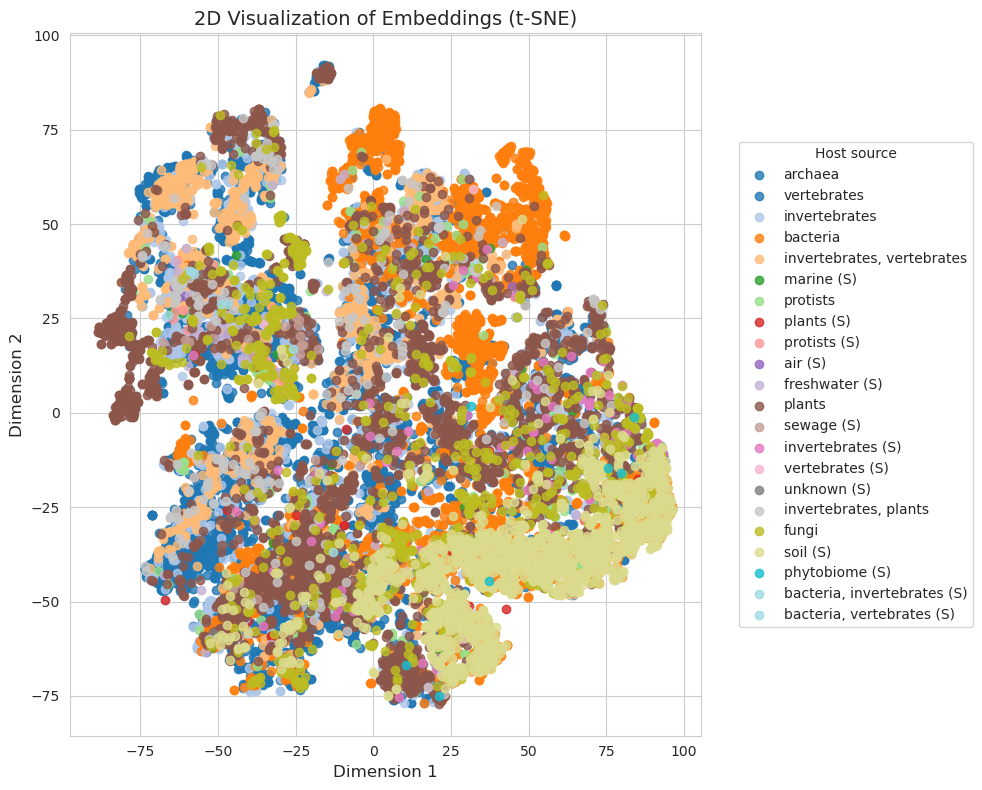

In [69]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_dnabert_2_117m['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_dnabert_2_117m['x'] = reduced_embeddings[:, 0]
virus_data_dnabert_2_117m['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_dnabert_2_117m['Host source'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_dnabert_2_117m[virus_data_dnabert_2_117m['Host source'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Host source', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


## zhihan1996/DNABERT-S

In [39]:
from transformers import AutoTokenizer, AutoModel
from transformers.models.bert.configuration_bert import BertConfig

# config = BertConfig.from_pretrained("zhihan1996/DNABERT-S")
model = AutoModel.from_pretrained("zhihan1996/DNABERT-S", trust_remote_code=True).half().to("cuda")
tokenizer = AutoTokenizer.from_pretrained("zhihan1996/DNABERT-S", trust_remote_code=True)

max_length = tokenizer.model_max_length

In [40]:
max_length = 512

In [41]:
# Параметры
batch_size = 4  # Настройте в соответствии с памятью GPU

# Настройка устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Создание датасета и загрузчика данных
dataset = SequenceDataset(record_values, tokenizer, max_length)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

# Перенос модели на устройство и установка режима оценки
model.to(device)
model.eval()

embeds = []

# Отключение вычисления градиентов
with torch.no_grad():
    for batch in tqdm(dataloader, desc="Processing Batches"):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)

        # Использование смешанной точности (опционально)
        with autocast():
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask,
                encoder_attention_mask=attention_mask,
                output_hidden_states=True
            )

        # Получение последнего скрытого слоя
        embeddings = outputs[0]  # Форма: (batch_size, seq_length, hidden_size)

        # Среднее пуллирование с учетом маски внимания
        attention_mask_expanded = attention_mask.unsqueeze(-1)  # Форма: (batch_size, seq_length, 1)
        sum_embeddings = torch.sum(embeddings * attention_mask_expanded, dim=1)  # Форма: (batch_size, hidden_size)
        sum_mask = torch.clamp(attention_mask_expanded.sum(dim=1), min=1e-9)  # Избегаем деления на ноль
        mean_embeddings = sum_embeddings / sum_mask  # Форма: (batch_size, hidden_size)

        # Перенос на CPU и преобразование в NumPy
        embeds.append(mean_embeddings.cpu().numpy())

# Объединение всех эмбеддингов в один массив NumPy
embeds = np.vstack(embeds)

# Опционально, очистка кэша CUDA после обработки
torch.cuda.empty_cache()

Processing Batches:   0%|                                                       | 0/4940 [00:00<?, ?it/s]/tmp/ipykernel_389725/2052114748.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Processing Batches: 100%|████████████████████████████████████████████| 4940/4940 [12:42<00:00,  6.48it/s]


In [42]:
import numpy as np
np.save("embeds_dnabert-s.npy", embeds)

In [119]:
import numpy as np

embeds = np.load("embeds_dnabert-s.npy").reshape((19758, 768))
np.array(embeds).shape

(19758, 768)

In [120]:
embeds_dict = dict(zip(record_ids, embeds))

In [121]:
embedding_matrix = [embeds_dict.get(id_, None) for id_ in virus_data.dropna()['Virus GENBANK accession']]

In [122]:
virus_data_dnabert_s = virus_data.dropna().copy()
virus_data_dnabert_s['embeds'] = embedding_matrix
virus_data_dnabert_s = virus_data_dnabert_s.dropna(subset = ['embeds'])

In [123]:
virus_data_dnabert_s

,Isolate ID,Family,Genus,Species,Host source,Virus GENBANK accession,Kingdom,embeds
0,1000002,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus beppuense,archaea,MH447526,Zilligvirae,"[-0.008433277, 0.02081414, 0.18243106, -0.0909..."
1,1000001,Lipothrixviridae,Alphalipothrixvirus,Alphalipothrixvirus umijigokuense,archaea,MK064563,Zilligvirae,"[0.0087422095, 0.0091190245, 0.14324716, -0.13..."
2,1000003,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus acidiani,archaea,AM087120,Zilligvirae,"[-0.05382443, 0.04471084, 0.09170796, -0.23472..."
3,1000008,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus hveragerdiense,archaea,AF440571,Zilligvirae,"[-0.14896318, -0.018691137, 0.024416044, -0.06..."
4,1000005,Lipothrixviridae,Betalipothrixvirus,Betalipothrixvirus pezzuloense,archaea,AM087122,Zilligvirae,"[-0.12368794, -0.0073386165, 0.12094514, -0.08..."
...,...,...,...,...,...,...,...,...
16515,1004826,Simuloviridae,Yingchengvirus,Yingchengvirus sinense,archaea,AY048850,Helvetiavirae,"[0.02051757, 0.007456982, 0.107765436, -0.1135..."
16516,1004828,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus helsinkii,archaea,JN968479,Helvetiavirae,"[0.048410352, -0.052014623, 0.18811795, -0.090..."
16517,1004829,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus pinkense,archaea,KC252997,Helvetiavirae,"[-0.0933436, -0.1264389, -0.0004287426, -0.124..."
16518,1004830,Sphaerolipoviridae,Alphasphaerolipovirus,Alphasphaerolipovirus serpentinense,archaea,AY950802,Helvetiavirae,"[-0.07108304, -0.025291588, 0.16910821, -0.002..."


In [124]:
np.stack(virus_data_dnabert_s['embeds'].values).shape

(16416, 768)

Число уникальных меток 10
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=-0.0284, NMI=0.0555, Silhouette Score=0.1747
K=4: ARI=0.0678, NMI=0.1491, Silhouette Score=0.0426
K=6: ARI=0.0435, NMI=0.1450, Silhouette Score=0.0423
K=8: ARI=0.0604, NMI=0.1617, Silhouette Score=0.0465
K=10: ARI=0.0850, NMI=0.1990, Silhouette Score=0.0511
K=12: ARI=0.0766, NMI=0.2002, Silhouette Score=0.0429
K=14: ARI=0.0737, NMI=0.2000, Silhouette Score=0.0433
K=16: ARI=0.0566, NMI=0.1993, Silhouette Score=0.0304
K=18: ARI=0.0520, NMI=0.1942, Silhouette Score=0.0325
K=20: ARI=0.0548, NMI=0.2011, Silhouette Score=0.0344
K=22: ARI=0.0561, NMI=0.2043, Silhouette Score=0.0298
K=24: ARI=0.0459, NMI=0.2017, Silhouette Score=0.0292
K=26: ARI=0.0431, NMI=0.2004, Silhouette Score=0.0264
K=28: ARI=0.0426, NMI=0.2048, Silhouette Score=0.0274
K=30: ARI=0.0403, NMI=0.2028, Silhouette Score=0.0268
K=32: ARI=0.0414, NMI=0.2046, Silhouette Score=0.0293
K=34: ARI=0.0410, NMI=0.2037, Silhouette Score=0.0313
K=36:

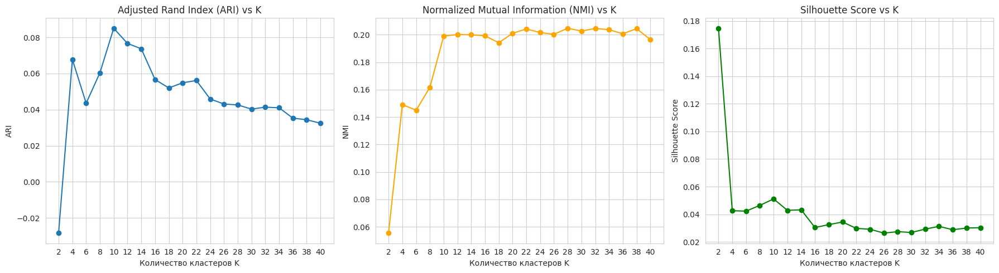

In [125]:
draw_kmeans_plot(virus_data_dnabert_s, 'Kingdom')

Число уникальных меток 22
Выполнение кластеризации K-Means и вычисление метрик:
K=2: ARI=0.0212, NMI=0.0677, Silhouette Score=0.1747
K=4: ARI=0.1590, NMI=0.2281, Silhouette Score=0.0426
K=6: ARI=0.1617, NMI=0.2289, Silhouette Score=0.0423
K=8: ARI=0.1550, NMI=0.2346, Silhouette Score=0.0465
K=10: ARI=0.1711, NMI=0.2628, Silhouette Score=0.0511
K=12: ARI=0.1523, NMI=0.2593, Silhouette Score=0.0429
K=14: ARI=0.1490, NMI=0.2595, Silhouette Score=0.0433
K=16: ARI=0.1274, NMI=0.2605, Silhouette Score=0.0304
K=18: ARI=0.1273, NMI=0.2608, Silhouette Score=0.0325
K=20: ARI=0.1237, NMI=0.2701, Silhouette Score=0.0344
K=22: ARI=0.1185, NMI=0.2672, Silhouette Score=0.0298
K=24: ARI=0.1060, NMI=0.2660, Silhouette Score=0.0292
K=26: ARI=0.1010, NMI=0.2635, Silhouette Score=0.0264
K=28: ARI=0.0989, NMI=0.2651, Silhouette Score=0.0274
K=30: ARI=0.0910, NMI=0.2593, Silhouette Score=0.0268
K=32: ARI=0.0919, NMI=0.2652, Silhouette Score=0.0293
K=34: ARI=0.0940, NMI=0.2693, Silhouette Score=0.0313
K=36: 

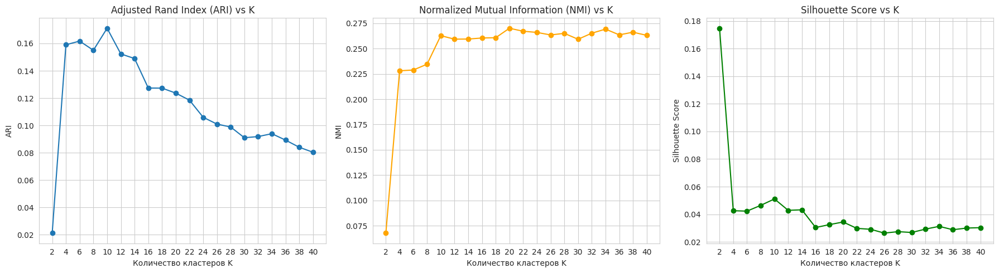

In [126]:
draw_kmeans_plot(virus_data_dnabert_s, 'Host source')

In [ ]:
# draw_kmeans_plot(virus_data_dnabert_s, 'Family', k_min = 250, k_max = 400, step = 15)

/home/ledneva/anaconda3/envs/myenv/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipykernel_525689/3031427010.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


10


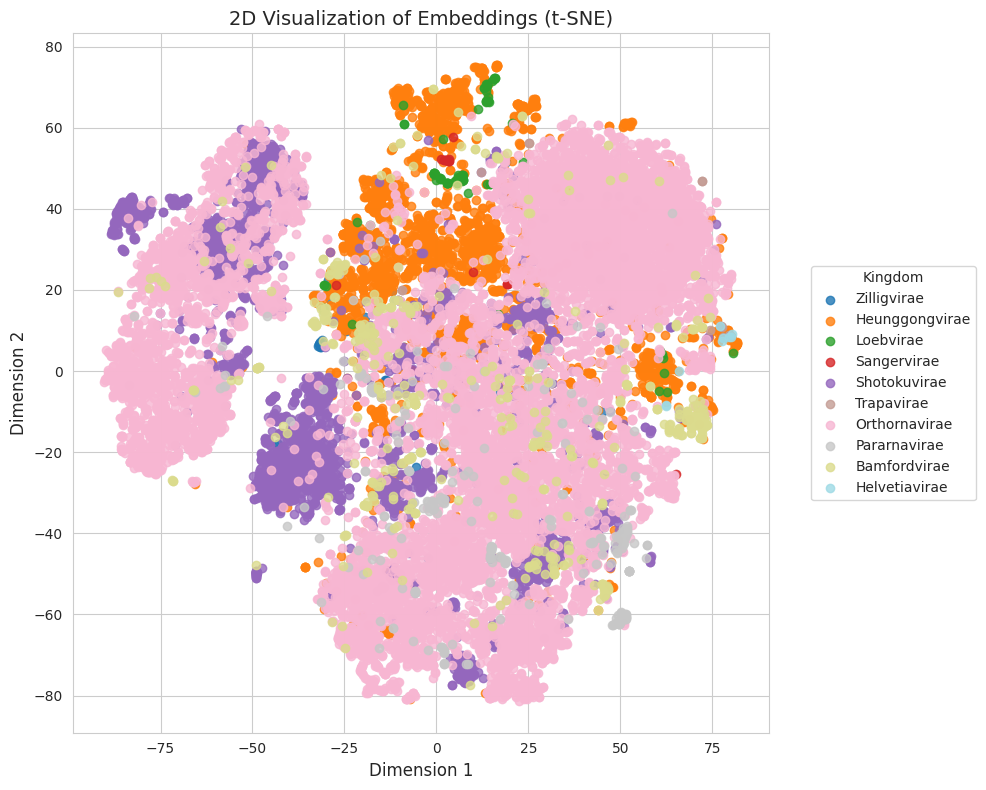

In [127]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_dnabert_s['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_dnabert_s['x'] = reduced_embeddings[:, 0]
virus_data_dnabert_s['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_dnabert_s['Kingdom'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_dnabert_s[virus_data_dnabert_s['Kingdom'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Kingdom', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_1359703/2538780751.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


310


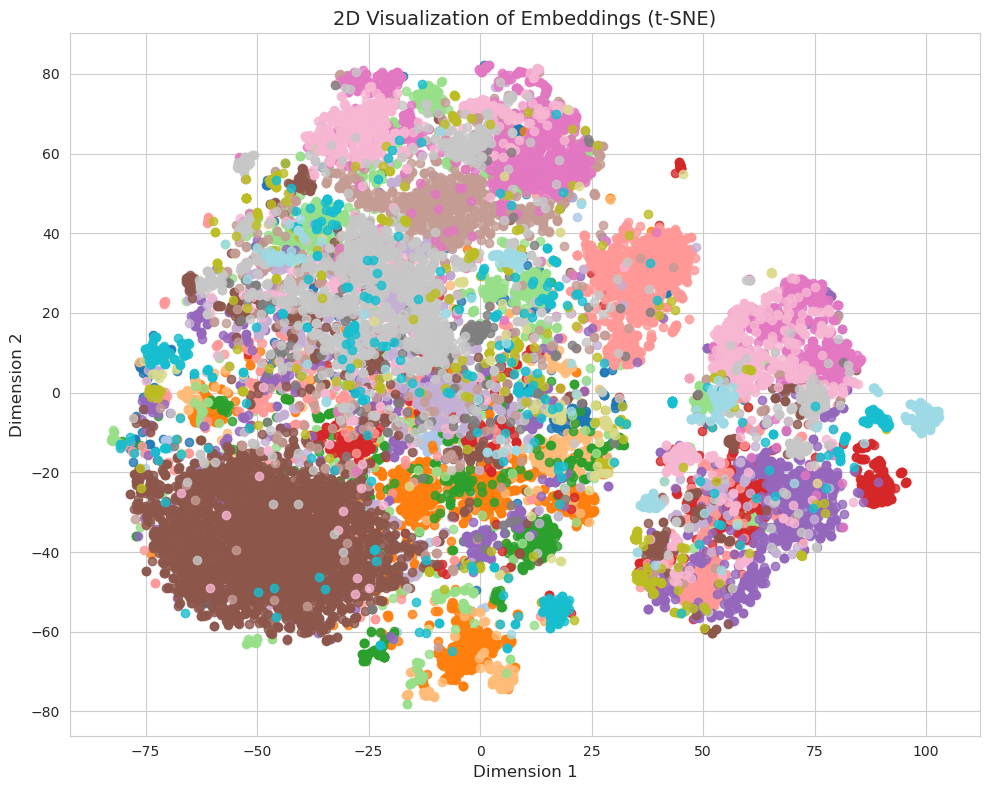

In [76]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_dnabert_s['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_dnabert_s['x'] = reduced_embeddings[:, 0]
virus_data_dnabert_s['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_dnabert_s['Family'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_dnabert_s[virus_data_dnabert_s['Family'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
# plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Family', fontsize=10)
plt.grid(True)
plt.tight_layout()
# Show the plot
plt.show()


/tmp/ipykernel_1359703/1598468964.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors


22


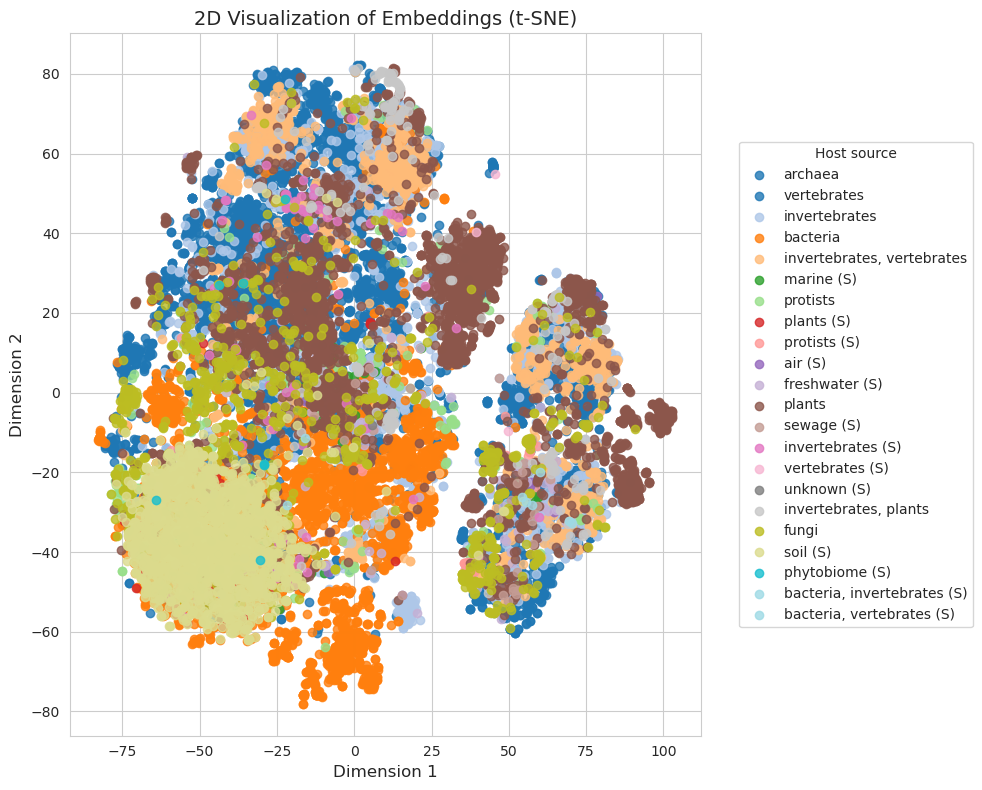

In [77]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply t-SNE to reduce embeddings to 2 dimensions
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
reduced_embeddings = tsne.fit_transform(np.stack(virus_data_dnabert_s['embeds'].values))

# Add reduced dimensions to the dataset
virus_data_dnabert_s['x'] = reduced_embeddings[:, 0]
virus_data_dnabert_s['y'] = reduced_embeddings[:, 1]

# Create a figure for plotting
plt.figure(figsize=(10, 8))

unique_types = virus_data_dnabert_s['Host source'].unique()
colors = cm.get_cmap('tab20', len(unique_types))  # Use 'tab20' for diverse colors
print(len(unique_types))

# Plot each type with a unique color
for i, t in enumerate(unique_types):
    subset = virus_data_dnabert_s[virus_data_dnabert_s['Host source'] == t]
    plt.scatter(subset['x'], subset['y'], label=f'{t}', alpha=0.8, color=colors(i))

# Title and axis labels
plt.title('2D Visualization of Embeddings (t-SNE)', fontsize=14)
plt.xlabel('Dimension 1', fontsize=12)
plt.ylabel('Dimension 2', fontsize=12)

# Move legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title='Host source', fontsize=10)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()
